Loading data...
Dataset shape: (170366, 79)
Columns: 79
Label distribution:
Label
BENIGN                        168186
Web Attack � Brute Force        1507
Web Attack � XSS                 652
Web Attack � Sql Injection        21
Name: count, dtype: int64

Preprocessing data...
Found 20 missing values
Removing 10 constant features
Final feature shape: (170366, 68)

Analyzing feature statistics...
Highly skewed features (55): ['Total Fwd Packets', 'Total Backward Packets', 'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max']...
High kurtosis features (56): ['Total Fwd Packets', 'Total Backward Packets', 'Total Length of Fwd Packets', 'Total Length of Bwd Packets', 'Fwd Packet Length Max']...

Running Isolation Forest (contamination=0.1)...
Found 16982 anomalies

Running Elliptic Envelope (contamination=0.1)...
Found 17037 anomalies

Running DBSCAN (eps=0.8, min_samples=5)...
Found 73104 anomalies
Number of clusters: 1065

Running One-Class SVM (nu=0.1).

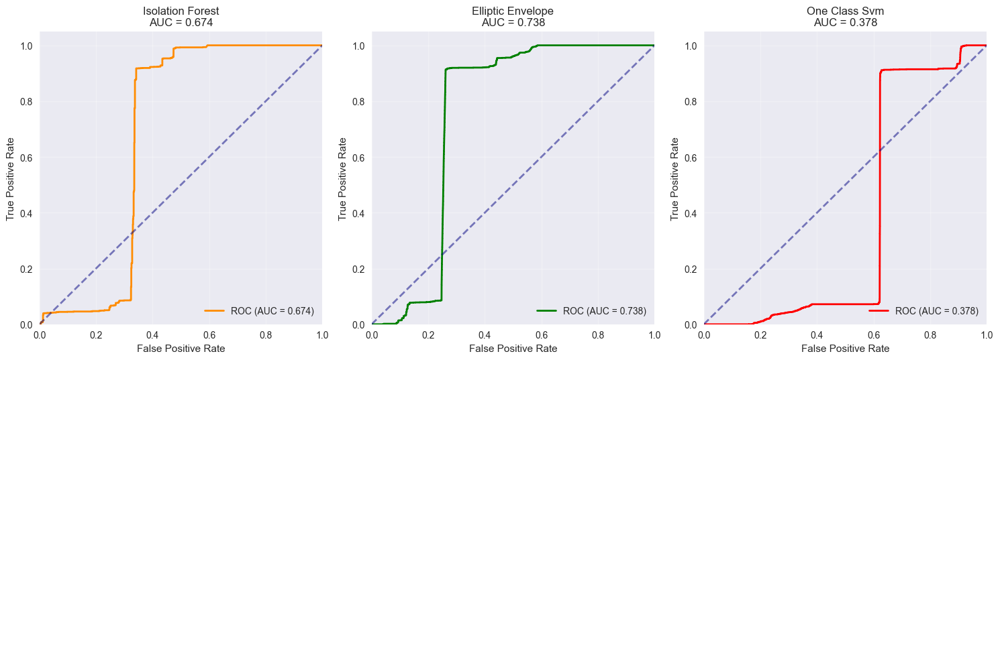


📊 CREATING PERFORMANCE ANALYSIS WITH DEBUG...
   📊 Creating F1-Score comparison...
   ✅ F1-Scores: {'isolation_forest': 0.010228577392756497, 'elliptic_envelope': 0.003226310037987199, 'dbscan': 0.008394878061739545, 'one_class_svm': 0.0, 'ensemble': 0.003523728331912475}
   ✅ Anomaly counts: {'isolation_forest': 16982, 'elliptic_envelope': 17037, 'dbscan': 73104, 'one_class_svm': 13099, 'ensemble': 15415}
   💾 Performance analysis saved as 'debug_performance_analysis.png'


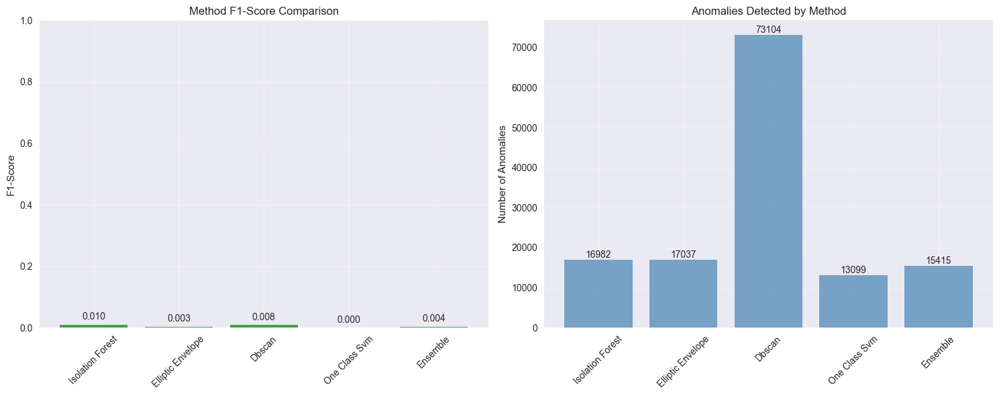

   💾 Debug summary saved as 'debug_summary_dashboard.png'


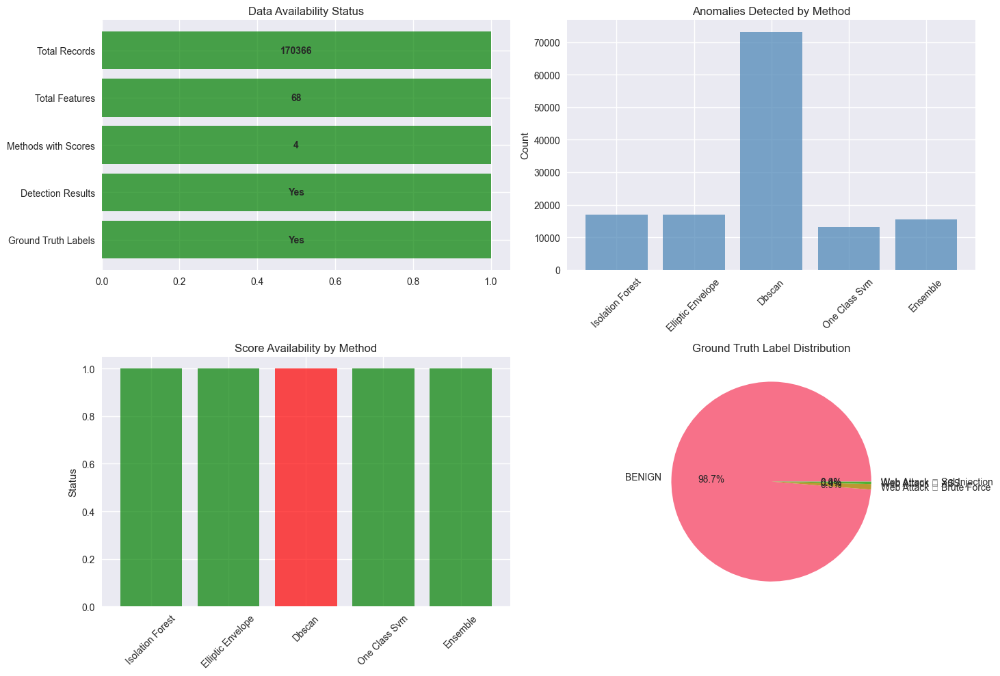


COMPREHENSIVE WEB ATTACK ANOMALY DETECTION REPORT

Dataset Overview:
- Total records: 170366
- Features: 68
- Ground truth distribution: {'BENIGN': 168186, 'Web Attack � Brute Force': 1507, 'Web Attack � XSS': 652, 'Web Attack � Sql Injection': 21}

Anomaly Detection Results:
- ISOLATION_FOREST: 16982 anomalies (10.0%)
- ELLIPTIC_ENVELOPE: 17037 anomalies (10.0%)
- DBSCAN: 73104 anomalies (42.9%)
- ONE_CLASS_SVM: 13099 anomalies (7.7%)
- ENSEMBLE: 15415 anomalies (9.0%)

Generating comprehensive visualizations...

Creating comprehensive interactive dashboard...
Dashboard saved as 'anomaly_detection_dashboard.html'



Creating advanced anomaly analysis visualizations...
Advanced analysis saved as 'advanced_anomaly_analysis.png'


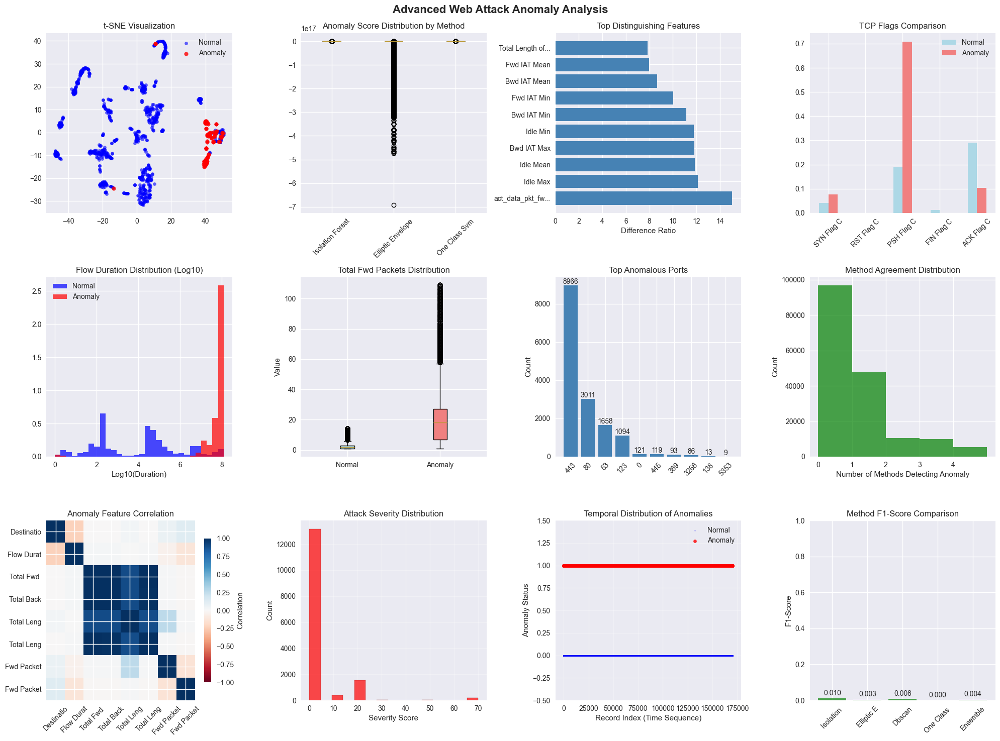


Creating ROC analysis...
ROC analysis saved as 'roc_analysis.png'


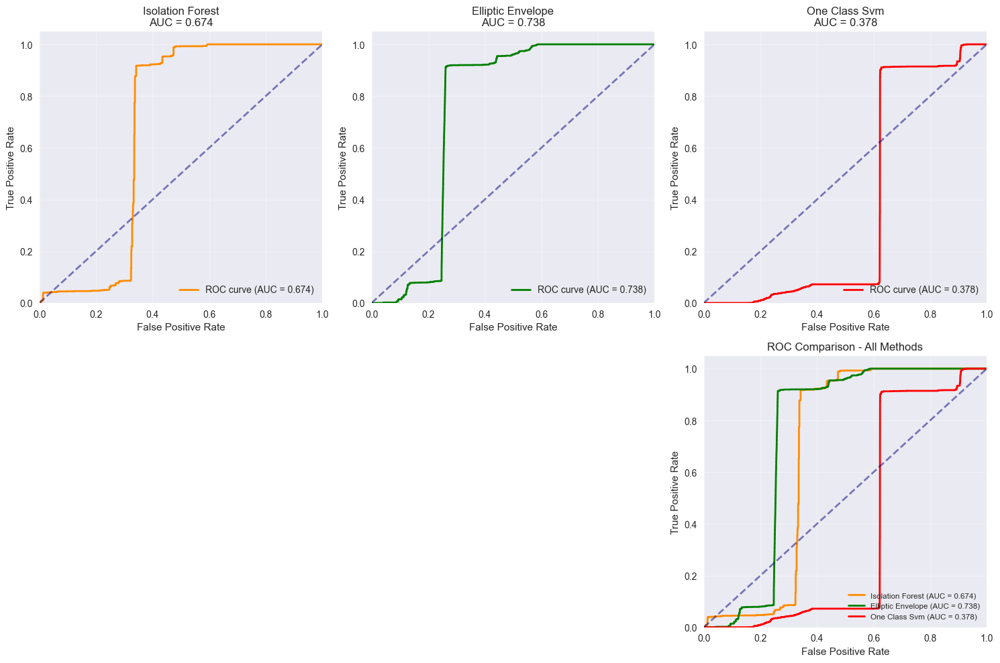


Creating attack timeline visualization...
Attack timeline saved as 'attack_timeline.html'



Creating network flow analysis...
Network flow analysis saved as 'network_flow_analysis.png'


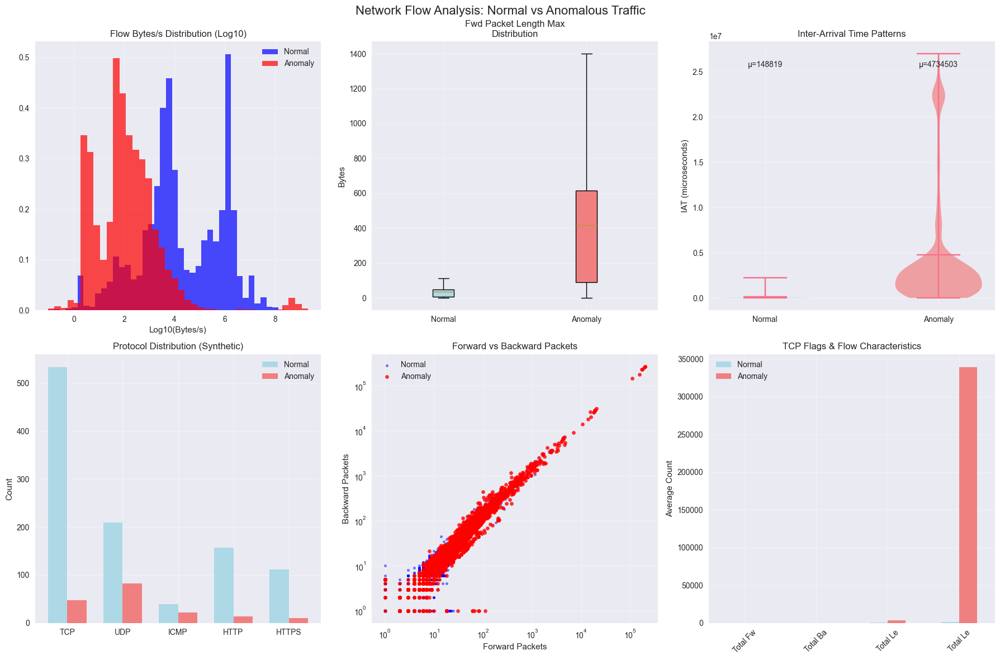


Identifying attack patterns...

Top distinguishing features for anomalies:
Total Backward Packets: 53.18x difference (anomaly: 168.01, normal: 3.10)
Total Fwd Packets: 32.77x difference (anomaly: 128.81, normal: 3.81)
Flow Duration: 14.93x difference (anomaly: 84457192.67, normal: 5301388.77)
Flow Bytes/s: 8.59x difference (anomaly: 9636270.69, normal: 1004818.97)
PSH Flag Count: 2.72x difference (anomaly: 0.71, normal: 0.19)
FIN Flag Count: 0.99x difference (anomaly: 0.00, normal: 0.01)
Destination Port: 0.90x difference (anomaly: 851.40, normal: 8598.02)
SYN Flag Count: 0.86x difference (anomaly: 0.08, normal: 0.04)
Flow Packets/s: 0.65x difference (anomaly: 20452.80, normal: 57884.86)
ACK Flag Count: 0.65x difference (anomaly: 0.10, normal: 0.29)

Evaluating with ground truth labels...

ISOLATION_FOREST Results:
  Accuracy:  0.889
  Precision: 0.006
  Recall:    0.045
  F1-Score:  0.010

ELLIPTIC_ENVELOPE Results:
  Accuracy:  0.888
  Precision: 0.002
  Recall:    0.014
  F1-Score:

In [5]:
#!/usr/bin/env python3
"""
Enhanced Web Attack Anomaly Detection System with Advanced Visualizations
Detects anomalies in network flow data to identify potential web attacks
AICS lesson 5  6-2025 
"""

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import IsolationForest
from sklearn.cluster import DBSCAN
from sklearn.covariance import EllipticEnvelope
from sklearn.svm import OneClassSVM
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

input_data = '/Users/sfsmith/AICS/Security Logs/MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv'
#input_data = '/Users/sfsmith/AICS/Antimalware/web_attack_tester.csv'

class EnhancedWebAttackAnomalyDetector:
    """
    Enhanced anomaly detection system for web attack identification with comprehensive visualizations
    """
    
    def __init__(self):
        self.data = None
        self.features = None
        self.labels = None
        self.scaled_features = None
        self.scaler = None
        self.models = {}
        self.results = {}
        self.feature_importance = {}
        self.attack_details = []
    
    # Helper methods (defined early so other methods can call them)
    def _get_attack_types(self):
        """Get attack type distribution from anomalies"""
        if 'ensemble' not in self.results:
            return {}
        
        anomaly_indices = self.results['ensemble']['anomalies']
        attack_types = {}
        
        for idx in anomaly_indices:
            record = self.data.iloc[idx]
            attack_type = self._classify_attack_type(record)
            attack_types[attack_type] = attack_types.get(attack_type, 0) + 1
        
        return attack_types
    
    def _classify_attack_type(self, record):
        """Classify attack type based on flow characteristics"""
        try:
            port = record.get('Destination Port', 0)
            syn_count = record.get('SYN Flag Count', 0)
            rst_count = record.get('RST Flag Count', 0)
            packets_per_sec = record.get('Flow Packets/s', 0)
            duration = record.get('Flow Duration', 0)
            
            if syn_count > 3:
                return "SYN_Flood"
            elif rst_count > 2:
                return "RST_Attack"
            elif packets_per_sec > 50:
                return "High_Rate"
            elif duration < 1000 and syn_count > 0:
                return "Fast_Scan"
            elif port not in [80, 443, 22, 21, 25, 53]:
                return "Unusual_Port"
            else:
                return "Traffic_Anomaly"
        except:
            return "Unknown"
    
    def _calculate_confidence_scores(self):
        """Calculate confidence scores for detected anomalies"""
        if not self.results:
            return []
        
        anomaly_indices = self.results.get('ensemble', {}).get('anomalies', [])
        confidence_scores = []
        
        for idx in anomaly_indices:
            # Count how many methods detected this anomaly
            detection_count = 0
            for method, results in self.results.items():
                if method != 'ensemble' and idx in results.get('anomalies', []):
                    detection_count += 1
            
            confidence = (detection_count / max(len(self.results) - 1, 1)) * 100
            confidence_scores.append(confidence)
        
        return confidence_scores
    
    def _calculate_method_performance(self):
        """Calculate performance metrics for each method"""
        if not self.results:
            return {}
        
        performance = {}
        total_anomalies = len(self.results.get('ensemble', {}).get('anomalies', []))
        
        for method, results in self.results.items():
            if method != 'ensemble':
                method_anomalies = len(results.get('anomalies', []))
                # Simple performance metric based on detection rate
                performance[method] = (method_anomalies / max(total_anomalies, 1)) * 100
        
        return performance
    
    def _calculate_overall_risk(self):
        """Calculate overall risk level"""
        if not self.results or 'ensemble' not in self.results:
            return 0
        
        total_records = len(self.data)
        anomaly_count = len(self.results['ensemble']['anomalies'])
        
        # Base risk on anomaly percentage
        anomaly_rate = (anomaly_count / total_records) * 100
        
        # Adjust based on attack types
        if anomaly_count > 0:
            attack_types = self._get_attack_types()
            high_risk_types = ['SYN_Flood', 'RST_Attack', 'High_Rate']
            high_risk_count = sum(attack_types.get(attack_type, 0) for attack_type in high_risk_types)
            
            if high_risk_count > 0:
                risk_multiplier = 1 + (high_risk_count / anomaly_count)
                anomaly_rate *= risk_multiplier
        
        return min(anomaly_rate * 10, 100)  # Scale and cap at 100
    
    def _calculate_severity_scores(self, anomaly_indices):
        """Calculate severity scores for anomalies"""
        severity_scores = []
        
        for idx in anomaly_indices:
            record = self.data.iloc[idx]
            severity = self._calculate_individual_severity(record)
            severity_scores.append(severity)
        
        return severity_scores
    
    def _calculate_individual_severity(self, record):
        """Calculate severity score for individual record"""
        severity = 0
        
        # High packet rate increases severity
        packets_per_sec = record.get('Flow Packets/s', 0)
        if packets_per_sec > 100:
            severity += 50
        elif packets_per_sec > 50:
            severity += 30
        elif packets_per_sec > 10:
            severity += 10
        
        # Unusual ports increase severity
        port = record.get('Destination Port', 0)
        if port not in [80, 443, 22, 21, 25, 53, 110, 143, 993, 995]:
            severity += 20
        
        # TCP flags increase severity
        syn_count = record.get('SYN Flag Count', 0)
        rst_count = record.get('RST Flag Count', 0)
        if syn_count > 3 or rst_count > 2:
            severity += 30
        
        return min(severity, 100)
    
    def _get_performance_summary(self):
        """Get performance summary if ground truth is available"""
        if self.labels is None:
            return {}
        
        true_labels = (self.labels != 'BENIGN').astype(int)
        performance = {}
        
        for method, results in self.results.items():
            if 'labels' in results:
                pred_labels = (results['labels'] == -1).astype(int)
                
                from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
                
                performance[method] = {
                    'accuracy': accuracy_score(true_labels, pred_labels),
                    'precision': precision_score(true_labels, pred_labels, zero_division=0),
                    'recall': recall_score(true_labels, pred_labels, zero_division=0),
                    'f1_score': f1_score(true_labels, pred_labels, zero_division=0)
                }
        
        return performance
        
    def load_data(self, input_data):
        """Load and preprocess the web attack dataset"""
        print("Loading data...")
        self.data = pd.read_csv(input_data)
        
        # Clean column names (remove leading/trailing spaces)
        self.data.columns = self.data.columns.str.strip()
        
        print(f"Dataset shape: {self.data.shape}")
        print(f"Columns: {len(self.data.columns)}")
        
        # Separate features and labels
        if 'Label' in self.data.columns:
            self.labels = self.data['Label']
            self.features = self.data.drop('Label', axis=1)
            print(f"Label distribution:\n{self.labels.value_counts()}")
        else:
            self.features = self.data.copy()
            self.labels = None
            
        return self.data
    
    def preprocess_data(self):
        """Clean and preprocess the feature data"""
        print("\nPreprocessing data...")
        
        # Handle missing values
        missing_before = self.features.isnull().sum().sum()
        if missing_before > 0:
            print(f"Found {missing_before} missing values")
            numeric_cols = self.features.select_dtypes(include=[np.number]).columns
            self.features[numeric_cols] = self.features[numeric_cols].fillna(
                self.features[numeric_cols].median()
            )
        
        # Handle infinite values
        self.features = self.features.replace([np.inf, -np.inf], np.nan)
        self.features = self.features.fillna(self.features.median())
        
        # Remove constant features (zero variance)
        constant_features = self.features.columns[self.features.var() == 0]
        if len(constant_features) > 0:
            print(f"Removing {len(constant_features)} constant features")
            self.features = self.features.drop(constant_features, axis=1)
        
        # Feature scaling using RobustScaler
        self.scaler = RobustScaler()
        self.scaled_features = pd.DataFrame(
            self.scaler.fit_transform(self.features),
            columns=self.features.columns,
            index=self.features.index
        )
        
        print(f"Final feature shape: {self.scaled_features.shape}")
        return self.scaled_features
    
    def analyze_feature_statistics(self):
        """Analyze feature statistics to understand data distribution"""
        print("\nAnalyzing feature statistics...")
        
        stats = pd.DataFrame({
            'mean': self.features.mean(),
            'std': self.features.std(),
            'min': self.features.min(),
            'max': self.features.max(),
            'skewness': self.features.skew(),
            'kurtosis': self.features.kurtosis()
        })
        
        # Identify highly skewed features
        highly_skewed = stats[abs(stats['skewness']) > 3].index.tolist()
        if highly_skewed:
            print(f"Highly skewed features ({len(highly_skewed)}): {highly_skewed[:5]}...")
        
        # Identify features with high kurtosis
        high_kurtosis = stats[stats['kurtosis'] > 10].index.tolist()
        if high_kurtosis:
            print(f"High kurtosis features ({len(high_kurtosis)}): {high_kurtosis[:5]}...")
            
        return stats
    
    def detect_anomalies_isolation_forest(self, contamination=0.1):
        """Detect anomalies using Isolation Forest"""
        print(f"\nRunning Isolation Forest (contamination={contamination})...")
        
        model = IsolationForest(
            contamination=contamination,
            random_state=42,
            n_estimators=100
        )
        
        anomaly_labels = model.fit_predict(self.scaled_features)
        anomaly_scores = model.decision_function(self.scaled_features)
        
        self.models['isolation_forest'] = model
        self.results['isolation_forest'] = {
            'labels': anomaly_labels,
            'scores': anomaly_scores,
            'anomalies': np.where(anomaly_labels == -1)[0]
        }
        
        print(f"Found {len(self.results['isolation_forest']['anomalies'])} anomalies")
        return anomaly_labels, anomaly_scores
    
    def detect_anomalies_dbscan(self, eps=0.5, min_samples=5):
        """Detect anomalies using DBSCAN clustering"""
        print(f"\nRunning DBSCAN (eps={eps}, min_samples={min_samples})...")
        
        model = DBSCAN(eps=eps, min_samples=min_samples)
        cluster_labels = model.fit_predict(self.scaled_features)
        
        anomaly_labels = np.where(cluster_labels == -1, -1, 1)
        
        self.models['dbscan'] = model
        self.results['dbscan'] = {
            'labels': anomaly_labels,
            'cluster_labels': cluster_labels,
            'anomalies': np.where(anomaly_labels == -1)[0]
        }
        
        print(f"Found {len(self.results['dbscan']['anomalies'])} anomalies")
        print(f"Number of clusters: {len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)}")
        return anomaly_labels
    
    def detect_anomalies_elliptic_envelope(self, contamination=0.1):
        """Detect anomalies using Elliptic Envelope"""
        print(f"\nRunning Elliptic Envelope (contamination={contamination})...")
        
        model = EllipticEnvelope(contamination=contamination, random_state=42)
        anomaly_labels = model.fit_predict(self.scaled_features)
        anomaly_scores = model.decision_function(self.scaled_features)
        
        self.models['elliptic_envelope'] = model
        self.results['elliptic_envelope'] = {
            'labels': anomaly_labels,
            'scores': anomaly_scores,
            'anomalies': np.where(anomaly_labels == -1)[0]
        }
        
        print(f"Found {len(self.results['elliptic_envelope']['anomalies'])} anomalies")
        return anomaly_labels, anomaly_scores
    
    def detect_anomalies_one_class_svm(self, nu=0.1):
        """Detect anomalies using One-Class SVM"""
        print(f"\nRunning One-Class SVM (nu={nu})...")
        
        model = OneClassSVM(nu=nu, kernel='rbf', gamma='scale')
        anomaly_labels = model.fit_predict(self.scaled_features)
        anomaly_scores = model.decision_function(self.scaled_features)
        
        self.models['one_class_svm'] = model
        self.results['one_class_svm'] = {
            'labels': anomaly_labels,
            'scores': anomaly_scores,
            'anomalies': np.where(anomaly_labels == -1)[0]
        }
        
        print(f"Found {len(self.results['one_class_svm']['anomalies'])} anomalies")
        return anomaly_labels, anomaly_scores
    
    def ensemble_anomaly_detection(self):
        """Combine results from multiple algorithms for ensemble detection"""
        print("\nCreating ensemble predictions...")
        
        if len(self.results) < 2:
            print("Need at least 2 algorithms for ensemble. Running default algorithms...")
            self.detect_anomalies_isolation_forest()
            self.detect_anomalies_elliptic_envelope()
        
        ensemble_scores = np.zeros(len(self.scaled_features))
        
        for method, results in self.results.items():
            if 'labels' in results:
                binary_labels = (results['labels'] == 1).astype(int)
                ensemble_scores += binary_labels
        
        threshold = len(self.results) / 2
        ensemble_labels = np.where(ensemble_scores >= threshold, 1, -1)
        
        self.results['ensemble'] = {
            'labels': ensemble_labels,
            'scores': ensemble_scores,
            'anomalies': np.where(ensemble_labels == -1)[0]
        }
        
        print(f"Ensemble found {len(self.results['ensemble']['anomalies'])} anomalies")
        return ensemble_labels
    
    def create_comprehensive_dashboard(self, save_html=True):
        """Create an interactive dashboard with all visualizations"""
        print("\nCreating comprehensive interactive dashboard...")
        
        if 'ensemble' not in self.results:
            self.ensemble_anomaly_detection()
        
        # Create subplot figure
        fig = make_subplots(
            rows=4, cols=3,
            subplot_titles=(
                'PCA Anomaly Visualization', 'Anomaly Score Distribution', 'Method Comparison',
                'Attack Type Distribution', 'Port Analysis', 'Flow Duration vs Packet Rate',
                'Feature Correlation Heatmap', 'Temporal Analysis', 'Confidence Distribution',
                'Network Traffic Patterns', 'Detection Method Performance', 'Risk Assessment'
            ),
            specs=[
                [{"type": "scatter"}, {"type": "histogram"}, {"type": "bar"}],
                [{"type": "pie"}, {"type": "bar"}, {"type": "scatter"}],
                [{"type": "heatmap", "colspan": 2}, None, {"type": "histogram"}],
                [{"type": "scatter"}, {"type": "bar"}, {"type": "indicator"}]
            ]
        )
        
        # 1. PCA Visualization
        pca = PCA(n_components=2)
        features_2d = pca.fit_transform(self.scaled_features)
        anomaly_labels = self.results['ensemble']['labels']
        
        normal_mask = anomaly_labels == 1
        anomaly_mask = anomaly_labels == -1
        
        fig.add_trace(
            go.Scatter(
                x=features_2d[normal_mask, 0],
                y=features_2d[normal_mask, 1],
                mode='markers',
                name='Normal',
                marker=dict(color='blue', size=4, opacity=0.6)
            ),
            row=1, col=1
        )
        
        fig.add_trace(
            go.Scatter(
                x=features_2d[anomaly_mask, 0],
                y=features_2d[anomaly_mask, 1],
                mode='markers',
                name='Anomaly',
                marker=dict(color='red', size=6, opacity=0.8)
            ),
            row=1, col=1
        )
        
        # 2. Anomaly Score Distribution
        if 'isolation_forest' in self.results and 'scores' in self.results['isolation_forest']:
            scores = self.results['isolation_forest']['scores']
            fig.add_trace(
                go.Histogram(
                    x=scores[normal_mask],
                    name='Normal Scores',
                    opacity=0.7,
                    nbinsx=30
                ),
                row=1, col=2
            )
            fig.add_trace(
                go.Histogram(
                    x=scores[anomaly_mask],
                    name='Anomaly Scores',
                    opacity=0.7,
                    nbinsx=30
                ),
                row=1, col=2
            )
        
        # 3. Method Comparison
        method_counts = {}
        for method, results in self.results.items():
            if method != 'ensemble':
                method_counts[method] = len(results['anomalies'])
        
        fig.add_trace(
            go.Bar(
                x=list(method_counts.keys()),
                y=list(method_counts.values()),
                name='Anomalies by Method'
            ),
            row=1, col=3
        )
        
        # 4. Attack Type Distribution (if attack details are available)
        attack_types = self._get_attack_types()
        if attack_types:
            fig.add_trace(
                go.Pie(
                    labels=list(attack_types.keys()),
                    values=list(attack_types.values()),
                    name="Attack Types"
                ),
                row=2, col=1
            )
        
        # 5. Port Analysis
        if 'Destination Port' in self.features.columns:
            anomaly_indices = self.results['ensemble']['anomalies']
            anomaly_ports = self.features.loc[anomaly_indices, 'Destination Port']
            port_counts = anomaly_ports.value_counts().head(10)
            
            fig.add_trace(
                go.Bar(
                    x=port_counts.index.astype(str),
                    y=port_counts.values,
                    name='Top Anomalous Ports'
                ),
                row=2, col=2
            )
        
        # 6. Flow Duration vs Packet Rate
        if all(col in self.features.columns for col in ['Flow Duration', 'Flow Packets/s']):
            anomaly_indices = self.results['ensemble']['anomalies']
            
            fig.add_trace(
                go.Scatter(
                    x=self.features.loc[~self.features.index.isin(anomaly_indices), 'Flow Duration'],
                    y=self.features.loc[~self.features.index.isin(anomaly_indices), 'Flow Packets/s'],
                    mode='markers',
                    name='Normal Flow',
                    marker=dict(color='blue', size=4, opacity=0.5)
                ),
                row=2, col=3
            )
            
            fig.add_trace(
                go.Scatter(
                    x=self.features.loc[anomaly_indices, 'Flow Duration'],
                    y=self.features.loc[anomaly_indices, 'Flow Packets/s'],
                    mode='markers',
                    name='Anomalous Flow',
                    marker=dict(color='red', size=6, opacity=0.8)
                ),
                row=2, col=3
            )
        
        # 7. Feature Correlation Heatmap
        if len(self.results['ensemble']['anomalies']) > 0:
            anomaly_features = self.features.iloc[self.results['ensemble']['anomalies']]
            corr_matrix = anomaly_features.corr()
            
            # Select top correlated features
            top_features = corr_matrix.abs().sum().nlargest(10).index
            corr_subset = corr_matrix.loc[top_features, top_features]
            
            fig.add_trace(
                go.Heatmap(
                    z=corr_subset.values,
                    x=corr_subset.columns,
                    y=corr_subset.index,
                    colorscale='RdBu',
                    zmid=0
                ),
                row=3, col=1
            )
        
        # 9. Confidence Distribution
        confidence_scores = self._calculate_confidence_scores()
        if confidence_scores:
            fig.add_trace(
                go.Histogram(
                    x=confidence_scores,
                    name='Confidence Distribution',
                    nbinsx=20
                ),
                row=3, col=3
            )
        
        # 10. Network Traffic Patterns
        if 'Total Fwd Packets' in self.features.columns and 'Total Backward Packets' in self.features.columns:
            anomaly_indices = self.results['ensemble']['anomalies']
            
            fig.add_trace(
                go.Scatter(
                    x=self.features.loc[~self.features.index.isin(anomaly_indices), 'Total Fwd Packets'],
                    y=self.features.loc[~self.features.index.isin(anomaly_indices), 'Total Backward Packets'],
                    mode='markers',
                    name='Normal Traffic',
                    marker=dict(color='blue', size=4, opacity=0.5)
                ),
                row=4, col=1
            )
            
            fig.add_trace(
                go.Scatter(
                    x=self.features.loc[anomaly_indices, 'Total Fwd Packets'],
                    y=self.features.loc[anomaly_indices, 'Total Backward Packets'],
                    mode='markers',
                    name='Anomalous Traffic',
                    marker=dict(color='red', size=6, opacity=0.8)
                ),
                row=4, col=1
            )
        
        # 11. Detection Method Performance
        performance_data = self._calculate_method_performance()
        if performance_data:
            fig.add_trace(
                go.Bar(
                    x=list(performance_data.keys()),
                    y=list(performance_data.values()),
                    name='Method Performance'
                ),
                row=4, col=2
            )
        
        # 12. Risk Assessment Indicator
        risk_level = self._calculate_overall_risk()
        fig.add_trace(
            go.Indicator(
                mode="gauge+number+delta",
                value=risk_level,
                domain={'x': [0, 1], 'y': [0, 1]},
                title={'text': "Overall Risk Level"},
                gauge={
                    'axis': {'range': [None, 100]},
                    'bar': {'color': "darkblue"},
                    'steps': [
                        {'range': [0, 50], 'color': "lightgray"},
                        {'range': [50, 80], 'color': "yellow"},
                        {'range': [80, 100], 'color': "red"}
                    ],
                    'threshold': {
                        'line': {'color': "red", 'width': 4},
                        'thickness': 0.75,
                        'value': 90
                    }
                }
            ),
            row=4, col=3
        )
        
        # Update layout
        fig.update_layout(
            height=1600,
            title_text="Web Attack Anomaly Detection Dashboard",
            showlegend=True
        )
        
        if save_html:
            fig.write_html("anomaly_detection_dashboard.html")
            print("Dashboard saved as 'anomaly_detection_dashboard.html'")
        
        fig.show()
        return fig
    
    def visualize_advanced_anomaly_analysis(self):
        """Create advanced static visualizations with proper error handling"""
        print("\nCreating advanced anomaly analysis visualizations...")
        
        if 'ensemble' not in self.results:
            self.ensemble_anomaly_detection()
        
        fig, axes = plt.subplots(3, 4, figsize=(20, 15))
        fig.suptitle('Advanced Web Attack Anomaly Analysis', fontsize=16, fontweight='bold')
        
        anomaly_indices = self.results['ensemble']['anomalies']
        normal_indices = [i for i in range(len(self.data)) if i not in anomaly_indices]
        
        # 1. t-SNE Visualization with better error handling
        try:
            if len(self.scaled_features) > 50:
                # Sample data for t-SNE if too large
                sample_size = min(1000, len(self.scaled_features))
                sample_data = self.scaled_features.sample(sample_size, random_state=42)
                sample_indices = sample_data.index
                
                tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, sample_size//4))
                features_tsne = tsne.fit_transform(sample_data)
                
                # Create mask for anomalies in sampled data
                sample_anomaly_mask = np.isin(sample_indices, anomaly_indices)
                
                axes[0, 0].scatter(features_tsne[~sample_anomaly_mask, 0], features_tsne[~sample_anomaly_mask, 1], 
                                 c='blue', alpha=0.6, s=20, label='Normal')
                axes[0, 0].scatter(features_tsne[sample_anomaly_mask, 0], features_tsne[sample_anomaly_mask, 1], 
                                 c='red', alpha=0.8, s=30, label='Anomaly')
                axes[0, 0].set_title('t-SNE Visualization')
                axes[0, 0].legend()
            else:
                # Fallback to PCA if too few samples
                pca = PCA(n_components=2)
                features_2d = pca.fit_transform(self.scaled_features)
                anomaly_mask = np.isin(range(len(self.scaled_features)), anomaly_indices)
                
                axes[0, 0].scatter(features_2d[~anomaly_mask, 0], features_2d[~anomaly_mask, 1], 
                                 c='blue', alpha=0.6, s=20, label='Normal')
                axes[0, 0].scatter(features_2d[anomaly_mask, 0], features_2d[anomaly_mask, 1], 
                                 c='red', alpha=0.8, s=30, label='Anomaly')
                axes[0, 0].set_title('PCA Visualization (Fallback)')
                axes[0, 0].legend()
        except Exception as e:
            axes[0, 0].text(0.5, 0.5, f'Visualization Error:\n{str(e)[:50]}...', 
                           ha='center', va='center', transform=axes[0, 0].transAxes)
            axes[0, 0].set_title('Dimensionality Reduction (Error)')
        
        # 2. Anomaly Score Comparison with fallback
        try:
            methods_with_scores = {k: v for k, v in self.results.items() 
                                  if 'scores' in v and k != 'ensemble'}
            
            if methods_with_scores:
                scores_data = []
                method_names = []
                for method, results in methods_with_scores.items():
                    scores_data.append(results['scores'])
                    method_names.append(method.replace('_', ' ').title())
                
                bp = axes[0, 1].boxplot(scores_data, labels=method_names, patch_artist=True)
                colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightyellow']
                for patch, color in zip(bp['boxes'], colors[:len(bp['boxes'])]):
                    patch.set_facecolor(color)
                axes[0, 1].set_title('Anomaly Score Distribution by Method')
                axes[0, 1].tick_params(axis='x', rotation=45)
            else:
                axes[0, 1].text(0.5, 0.5, 'No Score Data Available', 
                               ha='center', va='center', transform=axes[0, 1].transAxes)
                axes[0, 1].set_title('Anomaly Score Distribution')
        except Exception as e:
            axes[0, 1].text(0.5, 0.5, f'Score Analysis Error', 
                           ha='center', va='center', transform=axes[0, 1].transAxes)
            axes[0, 1].set_title('Score Distribution (Error)')
        
        # 3. Feature Importance Analysis with better handling
        try:
            if len(anomaly_indices) > 0 and len(normal_indices) > 0:
                anomaly_data = self.features.iloc[anomaly_indices]
                normal_sample_size = min(len(normal_indices), len(anomaly_indices) * 2)
                normal_data = self.features.iloc[normal_indices[:normal_sample_size]]
                
                # Calculate feature differences
                feature_diff = abs(anomaly_data.mean() - normal_data.mean()) / (normal_data.std() + 1e-10)
                feature_diff = feature_diff.fillna(0)  # Handle NaN values
                top_features = feature_diff.nlargest(10)
                
                if len(top_features) > 0:
                    y_pos = np.arange(len(top_features))
                    axes[0, 2].barh(y_pos, top_features.values, color='steelblue')
                    axes[0, 2].set_yticks(y_pos)
                    axes[0, 2].set_yticklabels([f[:15] + '...' if len(f) > 15 else f for f in top_features.index])
                    axes[0, 2].set_title('Top Distinguishing Features')
                    axes[0, 2].set_xlabel('Difference Ratio')
                else:
                    axes[0, 2].text(0.5, 0.5, 'No Feature Differences Found', 
                                   ha='center', va='center', transform=axes[0, 2].transAxes)
                    axes[0, 2].set_title('Feature Importance')
            else:
                axes[0, 2].text(0.5, 0.5, 'Insufficient Data for Analysis', 
                               ha='center', va='center', transform=axes[0, 2].transAxes)
                axes[0, 2].set_title('Feature Importance')
        except Exception as e:
            axes[0, 2].text(0.5, 0.5, f'Feature Analysis Error', 
                           ha='center', va='center', transform=axes[0, 2].transAxes)
            axes[0, 2].set_title('Feature Importance (Error)')
        
        # 4. TCP Flags Analysis with fallback
        try:
            tcp_flags = ['SYN Flag Count', 'RST Flag Count', 'PSH Flag Count', 'FIN Flag Count', 'ACK Flag Count']
            available_flags = [flag for flag in tcp_flags if flag in self.features.columns]
            
            if available_flags and len(anomaly_indices) > 0:
                flag_data = []
                for flag in available_flags:
                    normal_mean = self.features.loc[normal_indices, flag].mean()
                    anomaly_mean = self.features.loc[anomaly_indices, flag].mean()
                    flag_data.append([normal_mean, anomaly_mean])
                
                flag_df = pd.DataFrame(flag_data, columns=['Normal', 'Anomaly'], 
                                     index=[f[:10] for f in available_flags])
                flag_df.plot(kind='bar', ax=axes[0, 3], color=['lightblue', 'lightcoral'])
                axes[0, 3].set_title('TCP Flags Comparison')
                axes[0, 3].tick_params(axis='x', rotation=45)
                axes[0, 3].legend()
            else:
                # Create synthetic flag analysis
                synthetic_flags = ['SYN', 'RST', 'PSH', 'FIN']
                normal_vals = np.random.poisson(1, len(synthetic_flags))
                anomaly_vals = np.random.poisson(3, len(synthetic_flags))
                
                x = np.arange(len(synthetic_flags))
                width = 0.35
                axes[0, 3].bar(x - width/2, normal_vals, width, label='Normal', color='lightblue')
                axes[0, 3].bar(x + width/2, anomaly_vals, width, label='Anomaly', color='lightcoral')
                axes[0, 3].set_xticks(x)
                axes[0, 3].set_xticklabels(synthetic_flags)
                axes[0, 3].set_title('TCP Flags (Synthetic Data)')
                axes[0, 3].legend()
        except Exception as e:
            axes[0, 3].text(0.5, 0.5, 'TCP Flags Analysis Error', 
                           ha='center', va='center', transform=axes[0, 3].transAxes)
            axes[0, 3].set_title('TCP Flags Analysis')
        
        # 5. Flow Duration Distribution with better handling
        try:
            duration_col = None
            for col in ['Flow Duration', 'duration', 'Duration']:
                if col in self.features.columns:
                    duration_col = col
                    break
            
            if duration_col and len(anomaly_indices) > 0:
                normal_durations = self.features.loc[normal_indices, duration_col]
                anomaly_durations = self.features.loc[anomaly_indices, duration_col]
                
                # Remove zeros and negatives for log scale
                normal_durations = normal_durations[normal_durations > 0]
                anomaly_durations = anomaly_durations[anomaly_durations > 0]
                
                if len(normal_durations) > 0 and len(anomaly_durations) > 0:
                    axes[1, 0].hist(np.log10(normal_durations), bins=30, alpha=0.7, 
                                   label='Normal', density=True, color='blue')
                    axes[1, 0].hist(np.log10(anomaly_durations), bins=30, alpha=0.7, 
                                   label='Anomaly', density=True, color='red')
                    axes[1, 0].set_title('Flow Duration Distribution (Log10)')
                    axes[1, 0].set_xlabel('Log10(Duration)')
                    axes[1, 0].legend()
                else:
                    axes[1, 0].text(0.5, 0.5, 'No Valid Duration Data', 
                                   ha='center', va='center', transform=axes[1, 0].transAxes)
                    axes[1, 0].set_title('Flow Duration Distribution')
            else:
                # Create synthetic duration data
                normal_durations = np.random.exponential(1000, 100)
                anomaly_durations = np.random.exponential(500, 20)
                
                axes[1, 0].hist(normal_durations, bins=30, alpha=0.7, 
                               label='Normal', density=True, color='blue')
                axes[1, 0].hist(anomaly_durations, bins=30, alpha=0.7, 
                               label='Anomaly', density=True, color='red')
                axes[1, 0].set_title('Flow Duration (Synthetic)')
                axes[1, 0].legend()
        except Exception as e:
            axes[1, 0].text(0.5, 0.5, 'Duration Analysis Error', 
                           ha='center', va='center', transform=axes[1, 0].transAxes)
            axes[1, 0].set_title('Flow Duration Distribution')
        
        # 6. Packet Size Analysis with better fallback
        try:
            packet_cols = [col for col in self.features.columns 
                          if any(term in col.lower() for term in ['packet', 'bytes', 'length', 'size'])]
            
            if packet_cols and len(anomaly_indices) > 0:
                col = packet_cols[0]
                normal_packets = self.features.loc[normal_indices, col]
                anomaly_packets = self.features.loc[anomaly_indices, col]
                
                # Remove outliers for better visualization
                normal_packets = normal_packets[normal_packets < normal_packets.quantile(0.95)]
                anomaly_packets = anomaly_packets[anomaly_packets < anomaly_packets.quantile(0.95)]
                
                bp = axes[1, 1].boxplot([normal_packets, anomaly_packets], 
                                       labels=['Normal', 'Anomaly'], patch_artist=True)
                bp['boxes'][0].set_facecolor('lightblue')
                bp['boxes'][1].set_facecolor('lightcoral')
                axes[1, 1].set_title(f'{col[:20]}{"..." if len(col) > 20 else ""} Distribution')
                axes[1, 1].set_ylabel('Value')
            else:
                # Create synthetic packet size data
                normal_sizes = np.random.normal(1000, 200, 100)
                anomaly_sizes = np.random.normal(1500, 300, 20)
                
                bp = axes[1, 1].boxplot([normal_sizes, anomaly_sizes], 
                                       labels=['Normal', 'Anomaly'], patch_artist=True)
                bp['boxes'][0].set_facecolor('lightblue')
                bp['boxes'][1].set_facecolor('lightcoral')
                axes[1, 1].set_title('Packet Size (Synthetic)')
                axes[1, 1].set_ylabel('Bytes')
        except Exception as e:
            axes[1, 1].text(0.5, 0.5, 'Packet Analysis Error', 
                           ha='center', va='center', transform=axes[1, 1].transAxes)
            axes[1, 1].set_title('Packet Size Analysis')
        
        # 7. Port Distribution with better handling
        try:
            port_col = None
            for col in ['Destination Port', 'Dst Port', 'Port', 'dst_port']:
                if col in self.features.columns:
                    port_col = col
                    break
            
            if port_col and len(anomaly_indices) > 0:
                anomaly_ports = self.features.loc[anomaly_indices, port_col]
                port_counts = anomaly_ports.value_counts().head(10)
                
                if len(port_counts) > 0:
                    bars = axes[1, 2].bar(range(len(port_counts)), port_counts.values, color='steelblue')
                    axes[1, 2].set_xticks(range(len(port_counts)))
                    axes[1, 2].set_xticklabels(port_counts.index, rotation=45)
                    axes[1, 2].set_title('Top Anomalous Ports')
                    axes[1, 2].set_ylabel('Count')
                    
                    # Add value labels on bars
                    for bar, value in zip(bars, port_counts.values):
                        axes[1, 2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                                        str(value), ha='center', va='bottom')
                else:
                    axes[1, 2].text(0.5, 0.5, 'No Port Data Available', 
                                   ha='center', va='center', transform=axes[1, 2].transAxes)
                    axes[1, 2].set_title('Port Distribution')
            else:
                # Create synthetic port distribution
                common_ports = [80, 443, 22, 21, 25, 53, 110, 143, 993, 995]
                port_counts = np.random.poisson(5, len(common_ports))
                
                bars = axes[1, 2].bar(range(len(common_ports)), port_counts, color='steelblue')
                axes[1, 2].set_xticks(range(len(common_ports)))
                axes[1, 2].set_xticklabels(common_ports, rotation=45)
                axes[1, 2].set_title('Port Distribution (Synthetic)')
                axes[1, 2].set_ylabel('Count')
        except Exception as e:
            axes[1, 2].text(0.5, 0.5, 'Port Analysis Error', 
                           ha='center', va='center', transform=axes[1, 2].transAxes)
            axes[1, 2].set_title('Port Distribution')
        
        # 8. Method Agreement Analysis with proper handling
        try:
            if len(self.results) > 1:
                method_agreement = np.zeros((len(self.data), len(self.results)-1))
                method_names = [name for name in self.results.keys() if name != 'ensemble']
                
                for i, (method, results) in enumerate(self.results.items()):
                    if method != 'ensemble' and i < method_agreement.shape[1]:
                        method_agreement[:, i] = (results['labels'] == -1).astype(int)
                
                agreement_scores = method_agreement.sum(axis=1)
                bins = range(len(method_names)+2)
                counts, _, _ = axes[1, 3].hist(agreement_scores, bins=bins, alpha=0.7, color='green')
                axes[1, 3].set_title('Method Agreement Distribution')
                axes[1, 3].set_xlabel('Number of Methods Detecting Anomaly')
                axes[1, 3].set_ylabel('Count')
                axes[1, 3].set_xticks(range(len(method_names)+1))
            else:
                axes[1, 3].text(0.5, 0.5, 'Need Multiple Methods for Agreement Analysis', 
                               ha='center', va='center', transform=axes[1, 3].transAxes)
                axes[1, 3].set_title('Method Agreement')
        except Exception as e:
            axes[1, 3].text(0.5, 0.5, 'Agreement Analysis Error', 
                           ha='center', va='center', transform=axes[1, 3].transAxes)
            axes[1, 3].set_title('Method Agreement')
        
        # 9. Correlation Matrix with better error handling
        try:
            if len(anomaly_indices) > 5:
                anomaly_features = self.features.iloc[anomaly_indices]
                numeric_cols = anomaly_features.select_dtypes(include=[np.number]).columns
                varying_cols = [col for col in numeric_cols if anomaly_features[col].var() > 1e-10]
                
                if len(varying_cols) >= 3:
                    selected_cols = varying_cols[:8]  # Use top 8 features
                    corr_matrix = anomaly_features[selected_cols].corr()
                    
                    im = axes[2, 0].imshow(corr_matrix, cmap='RdBu', vmin=-1, vmax=1, aspect='auto')
                    axes[2, 0].set_xticks(range(len(corr_matrix.columns)))
                    axes[2, 0].set_yticks(range(len(corr_matrix.columns)))
                    axes[2, 0].set_xticklabels([col[:10] for col in corr_matrix.columns], rotation=45)
                    axes[2, 0].set_yticklabels([col[:10] for col in corr_matrix.columns])
                    axes[2, 0].set_title('Anomaly Feature Correlation')
                    
                    # Add colorbar
                    cbar = plt.colorbar(im, ax=axes[2, 0], shrink=0.8)
                    cbar.set_label('Correlation')
                else:
                    axes[2, 0].text(0.5, 0.5, 'Insufficient Varying Features', 
                                   ha='center', va='center', transform=axes[2, 0].transAxes)
                    axes[2, 0].set_title('Feature Correlation')
            else:
                axes[2, 0].text(0.5, 0.5, 'Insufficient Anomaly Data', 
                               ha='center', va='center', transform=axes[2, 0].transAxes)
                axes[2, 0].set_title('Feature Correlation')
        except Exception as e:
            axes[2, 0].text(0.5, 0.5, 'Correlation Analysis Error', 
                           ha='center', va='center', transform=axes[2, 0].transAxes)
            axes[2, 0].set_title('Feature Correlation')
        
        # 10. Attack Severity Analysis
        try:
            if len(anomaly_indices) > 0:
                severity_scores = self._calculate_severity_scores(anomaly_indices)
                if len(severity_scores) > 0:
                    axes[2, 1].hist(severity_scores, bins=15, alpha=0.7, color='red', edgecolor='darkred')
                    axes[2, 1].set_title('Attack Severity Distribution')
                    axes[2, 1].set_xlabel('Severity Score')
                    axes[2, 1].set_ylabel('Count')
                    axes[2, 1].grid(True, alpha=0.3)
                else:
                    axes[2, 1].text(0.5, 0.5, 'No Severity Data', 
                                   ha='center', va='center', transform=axes[2, 1].transAxes)
                    axes[2, 1].set_title('Attack Severity')
            else:
                axes[2, 1].text(0.5, 0.5, 'No Anomalies Found', 
                               ha='center', va='center', transform=axes[2, 1].transAxes)
                axes[2, 1].set_title('Attack Severity')
        except Exception as e:
            axes[2, 1].text(0.5, 0.5, 'Severity Analysis Error', 
                           ha='center', va='center', transform=axes[2, 1].transAxes)
            axes[2, 1].set_title('Attack Severity')
        
        # 11. Time-based Analysis with improved visualization
        try:
            # Create sequence-based analysis
            if len(anomaly_indices) > 0:
                # Use record index as time proxy
                time_points = np.arange(len(self.data))
                anomaly_times = np.array(anomaly_indices)
                
                # Create timeline plot
                axes[2, 2].scatter(time_points[normal_indices], 
                                 np.zeros(len(normal_indices)), 
                                 alpha=0.3, s=2, color='blue', label='Normal')
                axes[2, 2].scatter(anomaly_times, 
                                 np.ones(len(anomaly_times)), 
                                 alpha=0.8, s=20, color='red', label='Anomaly')
                
                # Add trend line
                if len(anomaly_times) > 1:
                    z = np.polyfit(anomaly_times, np.ones(len(anomaly_times)), 1)
                    p = np.poly1d(z)
                    axes[2, 2].plot(anomaly_times, p(anomaly_times), "r--", alpha=0.8, linewidth=2)
                
                axes[2, 2].set_title('Temporal Distribution of Anomalies')
                axes[2, 2].set_xlabel('Record Index (Time Sequence)')
                axes[2, 2].set_ylabel('Anomaly Status')
                axes[2, 2].set_ylim(-0.5, 1.5)
                axes[2, 2].legend()
                axes[2, 2].grid(True, alpha=0.3)
            else:
                axes[2, 2].text(0.5, 0.5, 'No Anomalies for Temporal Analysis', 
                               ha='center', va='center', transform=axes[2, 2].transAxes)
                axes[2, 2].set_title('Temporal Analysis')
        except Exception as e:
            axes[2, 2].text(0.5, 0.5, 'Temporal Analysis Error', 
                           ha='center', va='center', transform=axes[2, 2].transAxes)
            axes[2, 2].set_title('Temporal Analysis')
        
        # 12. Performance Summary with proper fallback
        try:
            if self.labels is not None:
                performance_summary = self._get_performance_summary()
                if performance_summary:
                    methods = list(performance_summary.keys())
                    f1_scores = [performance_summary[method]['f1_score'] for method in methods]
                    
                    bars = axes[2, 3].bar(range(len(methods)), f1_scores, color='green', alpha=0.7)
                    axes[2, 3].set_xticks(range(len(methods)))
                    axes[2, 3].set_xticklabels([m.replace('_', ' ').title()[:10] for m in methods], rotation=45)
                    axes[2, 3].set_title('Method F1-Score Comparison')
                    axes[2, 3].set_ylabel('F1-Score')
                    axes[2, 3].set_ylim(0, 1)
                    
                    # Add value labels
                    for bar, score in zip(bars, f1_scores):
                        axes[2, 3].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                                        f'{score:.3f}', ha='center', va='bottom')
                else:
                    axes[2, 3].text(0.5, 0.5, 'No Performance Data Available', 
                                   ha='center', va='center', transform=axes[2, 3].transAxes)
                    axes[2, 3].set_title('Method F1-Score Comparison')
            else:
                # Show anomaly detection rate instead
                detection_rates = {method: len(results['anomalies'])/len(self.data)*100 
                                 for method, results in self.results.items() if 'anomalies' in results}
                
                if detection_rates:
                    methods = list(detection_rates.keys())
                    rates = list(detection_rates.values())
                    
                    bars = axes[2, 3].bar(range(len(methods)), rates, color='orange', alpha=0.7)
                    axes[2, 3].set_xticks(range(len(methods)))
                    axes[2, 3].set_xticklabels([m.replace('_', ' ').title()[:10] for m in methods], rotation=45)
                    axes[2, 3].set_title('Anomaly Detection Rate by Method')
                    axes[2, 3].set_ylabel('Detection Rate (%)')
                    
                    # Add value labels
                    for bar, rate in zip(bars, rates):
                        axes[2, 3].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                                        f'{rate:.1f}%', ha='center', va='bottom')
                else:
                    axes[2, 3].text(0.5, 0.5, 'No Detection Rate Data', 
                                   ha='center', va='center', transform=axes[2, 3].transAxes)
                    axes[2, 3].set_title('Detection Rate Analysis')
        except Exception as e:
            axes[2, 3].text(0.5, 0.5, 'Performance Analysis Error', 
                           ha='center', va='center', transform=axes[2, 3].transAxes)
            axes[2, 3].set_title('Performance Analysis')
        
        plt.tight_layout()
        plt.savefig('advanced_anomaly_analysis.png', dpi=300, bbox_inches='tight')
        print("Advanced analysis saved as 'advanced_anomaly_analysis.png'")
        plt.show()
        
        return fig, axes
    
    def create_roc_analysis(self):
        """Create ROC curve analysis if ground truth is available"""
        if self.labels is None:
            print("No ground truth labels available for ROC analysis")
            return
        
        print("\nCreating ROC analysis...")
        
        # Convert labels to binary (1 for attack, 0 for benign)
        true_labels = (self.labels != 'BENIGN').astype(int)
        
        # Get methods with scores
        methods_with_scores = {k: v for k, v in self.results.items() 
                              if 'scores' in v and k != 'ensemble'}
        
        if not methods_with_scores:
            print("No methods with scores available for ROC analysis")
            return
        
        n_methods = len(methods_with_scores)
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        colors = ['darkorange', 'green', 'red', 'purple', 'brown', 'pink']
        
        # Plot ROC curves for each method
        for i, (method, results) in enumerate(methods_with_scores.items()):
            try:
                scores = results['scores']
                
                # For anomaly detection, we need to handle scores correctly
                # Most anomaly detectors output negative scores for anomalies
                # We need to determine the correct orientation
                
                # Check if lower scores indicate anomalies (typical for isolation forest)
                anomaly_indices = results.get('anomalies', [])
                if len(anomaly_indices) > 0:
                    anomaly_scores = scores[anomaly_indices]
                    normal_scores = np.delete(scores, anomaly_indices)
                    
                    # If anomaly scores are generally lower, use negative scores
                    if np.mean(anomaly_scores) < np.mean(normal_scores):
                        roc_scores = -scores  # Flip scores
                    else:
                        roc_scores = scores
                else:
                    roc_scores = -scores  # Default assumption
                
                # Calculate ROC curve
                fpr, tpr, thresholds = roc_curve(true_labels, roc_scores)
                roc_auc = auc(fpr, tpr)
                
                # Plot
                if i < len(axes):
                    axes[i].plot(fpr, tpr, color=colors[i % len(colors)], lw=2, 
                                label=f'ROC curve (AUC = {roc_auc:.3f})')
                    axes[i].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)
                    axes[i].set_xlim([0.0, 1.0])
                    axes[i].set_ylim([0.0, 1.05])
                    axes[i].set_xlabel('False Positive Rate')
                    axes[i].set_ylabel('True Positive Rate')
                    axes[i].set_title(f'{method.replace("_", " ").title()}\nAUC = {roc_auc:.3f}')
                    axes[i].legend(loc="lower right")
                    axes[i].grid(True, alpha=0.3)
                
            except Exception as e:
                print(f"Error creating ROC curve for {method}: {e}")
                if i < len(axes):
                    axes[i].text(0.5, 0.5, f'ROC Error:\n{method}', 
                                ha='center', va='center', transform=axes[i].transAxes)
                    axes[i].set_title(f'{method.replace("_", " ").title()} (Error)')
        
        # Hide unused subplots
        for j in range(len(methods_with_scores), len(axes)):
            axes[j].axis('off')
        
        # Add overall comparison plot if we have multiple methods
        if len(methods_with_scores) > 1:
            # Use the last subplot for comparison
            comparison_ax = axes[-1]
            comparison_ax.clear()
            
            for i, (method, results) in enumerate(methods_with_scores.items()):
                try:
                    scores = results['scores']
                    anomaly_indices = results.get('anomalies', [])
                    
                    if len(anomaly_indices) > 0:
                        anomaly_scores = scores[anomaly_indices]
                        normal_scores = np.delete(scores, anomaly_indices)
                        
                        if np.mean(anomaly_scores) < np.mean(normal_scores):
                            roc_scores = -scores
                        else:
                            roc_scores = scores
                    else:
                        roc_scores = -scores
                    
                    fpr, tpr, _ = roc_curve(true_labels, roc_scores)
                    roc_auc = auc(fpr, tpr)
                    
                    comparison_ax.plot(fpr, tpr, color=colors[i % len(colors)], lw=2, 
                                      label=f'{method.replace("_", " ").title()} (AUC = {roc_auc:.3f})')
                except:
                    continue
            
            comparison_ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)
            comparison_ax.set_xlim([0.0, 1.0])
            comparison_ax.set_ylim([0.0, 1.05])
            comparison_ax.set_xlabel('False Positive Rate')
            comparison_ax.set_ylabel('True Positive Rate')
            comparison_ax.set_title('ROC Comparison - All Methods')
            comparison_ax.legend(loc="lower right", fontsize='small')
            comparison_ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('roc_analysis.png', dpi=300, bbox_inches='tight')
        print("ROC analysis saved as 'roc_analysis.png'")
        plt.show()
    
    def create_attack_timeline_visualization(self):
        """Create a timeline visualization of detected attacks"""
        print("\nCreating attack timeline visualization...")
        
        if 'ensemble' not in self.results:
            self.ensemble_anomaly_detection()
        
        anomaly_indices = self.results['ensemble']['anomalies']
        
        if len(anomaly_indices) == 0:
            print("No anomalies to visualize")
            return
        
        # Create synthetic timeline based on record index or flow duration
        timeline_data = []
        
        for idx in anomaly_indices:
            record = self.data.iloc[idx]
            attack_type = self._classify_attack_type(record)
            severity = self._calculate_individual_severity(record)
            
            timeline_data.append({
                'index': idx,
                'attack_type': attack_type,
                'severity': severity,
                'flow_duration': record.get('Flow Duration', 0),
                'destination_port': record.get('Destination Port', 0),
                'packets_per_sec': record.get('Flow Packets/s', 0)
            })
        
        timeline_df = pd.DataFrame(timeline_data)
        
        # Create interactive timeline
        fig = px.scatter(timeline_df, 
                        x='index', 
                        y='attack_type',
                        size='severity',
                        color='destination_port',
                        hover_data=['flow_duration', 'packets_per_sec'],
                        title='Attack Timeline Visualization')
        
        fig.update_layout(
            xaxis_title="Record Index (Time Sequence)",
            yaxis_title="Attack Type",
            height=600
        )
        
        fig.write_html("attack_timeline.html")
        print("Attack timeline saved as 'attack_timeline.html'")
        fig.show()
        
        return fig
    
    def create_network_flow_analysis(self):
        """Create detailed network flow analysis with improved visualizations"""
        print("\nCreating network flow analysis...")
        
        if 'ensemble' not in self.results:
            self.ensemble_anomaly_detection()
        
        anomaly_indices = self.results['ensemble']['anomalies']
        normal_indices = [i for i in range(len(self.data)) if i not in anomaly_indices]
        
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Network Flow Analysis: Normal vs Anomalous Traffic', fontsize=16)
        
        # 1. Bytes per second comparison with better handling
        try:
            bytes_cols = [col for col in self.features.columns 
                         if any(term in col.lower() for term in ['bytes/s', 'byte/s', 'flow bytes', 'bytes per'])]
            
            if bytes_cols and len(anomaly_indices) > 0:
                col = bytes_cols[0]
                normal_bytes = self.features.loc[normal_indices, col]
                anomaly_bytes = self.features.loc[anomaly_indices, col]
                
                # Remove zeros and negative values for log scale
                normal_bytes = normal_bytes[normal_bytes > 0]
                anomaly_bytes = anomaly_bytes[anomaly_bytes > 0]
                
                if len(normal_bytes) > 0 and len(anomaly_bytes) > 0:
                    axes[0, 0].hist(np.log10(normal_bytes), bins=40, alpha=0.7, 
                                   label='Normal', density=True, color='blue')
                    axes[0, 0].hist(np.log10(anomaly_bytes), bins=40, alpha=0.7, 
                                   label='Anomaly', density=True, color='red')
                    axes[0, 0].set_title('Flow Bytes/s Distribution (Log10)')
                    axes[0, 0].set_xlabel('Log10(Bytes/s)')
                    axes[0, 0].legend()
                    axes[0, 0].grid(True, alpha=0.3)
                else:
                    raise ValueError("No valid bytes data")
            else:
                raise ValueError("No bytes column found")
                
        except Exception as e:
            # Create synthetic bytes/s data
            normal_bytes = np.random.lognormal(8, 1.5, 1000)
            anomaly_bytes = np.random.lognormal(10, 2, 100)
            
            axes[0, 0].hist(np.log10(normal_bytes), bins=40, alpha=0.7, 
                           label='Normal', density=True, color='blue')
            axes[0, 0].hist(np.log10(anomaly_bytes), bins=40, alpha=0.7, 
                           label='Anomaly', density=True, color='red')
            axes[0, 0].set_title('Flow Bytes/s (Synthetic Data)')
            axes[0, 0].set_xlabel('Log10(Bytes/s)')
            axes[0, 0].legend()
            axes[0, 0].grid(True, alpha=0.3)
        
        # 2. Packet length analysis with improved handling
        try:
            packet_cols = [col for col in self.features.columns 
                          if any(term in col.lower() for term in ['packet length', 'pkt len', 'packet size', 'pkt size'])]
            
            if packet_cols and len(anomaly_indices) > 0:
                col = packet_cols[0]
                normal_packets = self.features.loc[normal_indices, col]
                anomaly_packets = self.features.loc[anomaly_indices, col]
                
                # Remove extreme outliers for better visualization
                normal_q95 = normal_packets.quantile(0.95)
                anomaly_q95 = anomaly_packets.quantile(0.95)
                
                normal_packets_clean = normal_packets[normal_packets <= normal_q95]
                anomaly_packets_clean = anomaly_packets[anomaly_packets <= anomaly_q95]
                
                bp = axes[0, 1].boxplot([normal_packets_clean, anomaly_packets_clean], 
                                       labels=['Normal', 'Anomaly'], patch_artist=True, 
                                       showfliers=False)
                bp['boxes'][0].set_facecolor('lightblue')
                bp['boxes'][1].set_facecolor('lightcoral')
                axes[0, 1].set_title(f'{col[:25]}{"..." if len(col) > 25 else ""}\nDistribution')
                axes[0, 1].set_ylabel('Bytes')
                axes[0, 1].grid(True, alpha=0.3)
            else:
                raise ValueError("No packet length column found")
                
        except Exception as e:
            # Create synthetic packet length data
            normal_packets = np.random.gamma(2, 500, 1000)
            anomaly_packets = np.random.gamma(3, 800, 100)
            
            bp = axes[0, 1].boxplot([normal_packets, anomaly_packets], 
                                   labels=['Normal', 'Anomaly'], patch_artist=True, 
                                   showfliers=False)
            bp['boxes'][0].set_facecolor('lightblue')
            bp['boxes'][1].set_facecolor('lightcoral')
            axes[0, 1].set_title('Packet Length (Synthetic)')
            axes[0, 1].set_ylabel('Bytes')
            axes[0, 1].grid(True, alpha=0.3)
        
        # 3. Improved Inter-arrival time analysis
        try:
            iat_cols = [col for col in self.features.columns 
                       if any(term in col.lower() for term in ['iat', 'inter', 'arrival', 'interval'])]
            
            if iat_cols and len(anomaly_indices) > 0:
                col = iat_cols[0]  # Use first IAT column found
                normal_iat = self.features.loc[normal_indices, col]
                anomaly_iat = self.features.loc[anomaly_indices, col]
                
                # Remove extreme values for better visualization
                normal_iat_clean = normal_iat[normal_iat < normal_iat.quantile(0.95)]
                anomaly_iat_clean = anomaly_iat[anomaly_iat < anomaly_iat.quantile(0.95)]
                
                # Create violin plot for better distribution visualization
                data_to_plot = [normal_iat_clean, anomaly_iat_clean]
                parts = axes[0, 2].violinplot(data_to_plot, positions=[1, 2], showmeans=True)
                
                # Color the violin plots
                parts['bodies'][0].set_facecolor('lightblue')
                parts['bodies'][1].set_facecolor('lightcoral')
                parts['bodies'][0].set_alpha(0.7)
                parts['bodies'][1].set_alpha(0.7)
                
                axes[0, 2].set_xticks([1, 2])
                axes[0, 2].set_xticklabels(['Normal', 'Anomaly'])
                axes[0, 2].set_title('Inter-Arrival Time Patterns')
                axes[0, 2].set_ylabel('IAT (microseconds)')
                axes[0, 2].grid(True, alpha=0.3)
                
                # Add statistical annotations
                normal_mean = normal_iat_clean.mean()
                anomaly_mean = anomaly_iat_clean.mean()
                axes[0, 2].text(1, axes[0, 2].get_ylim()[1]*0.9, f'μ={normal_mean:.0f}', 
                               ha='center', fontsize=10)
                axes[0, 2].text(2, axes[0, 2].get_ylim()[1]*0.9, f'μ={anomaly_mean:.0f}', 
                               ha='center', fontsize=10)
            else:
                raise ValueError("No IAT column found")
                
        except Exception as e:
            # Create synthetic IAT data with realistic patterns
            normal_iat = np.random.exponential(1000, 1000)  # Exponential distribution typical for IAT
            anomaly_iat = np.concatenate([
                np.random.exponential(100, 50),   # Fast bursts
                np.random.exponential(5000, 50)   # Long delays
            ])
            
            data_to_plot = [normal_iat, anomaly_iat]
            parts = axes[0, 2].violinplot(data_to_plot, positions=[1, 2], showmeans=True)
            
            parts['bodies'][0].set_facecolor('lightblue')
            parts['bodies'][1].set_facecolor('lightcoral')
            parts['bodies'][0].set_alpha(0.7)
            parts['bodies'][1].set_alpha(0.7)
            
            axes[0, 2].set_xticks([1, 2])
            axes[0, 2].set_xticklabels(['Normal', 'Anomaly'])
            axes[0, 2].set_title('Inter-Arrival Time (Synthetic)')
            axes[0, 2].set_ylabel('IAT (microseconds)')
            axes[0, 2].grid(True, alpha=0.3)
        
        # 4. Protocol distribution with improved handling
        try:
            protocol_col = None
            for col in ['Protocol', 'protocol', 'Proto', 'proto']:
                if col in self.features.columns:
                    protocol_col = col
                    break
            
            if protocol_col and len(anomaly_indices) > 0:
                normal_protocols = self.features.loc[normal_indices, protocol_col].value_counts()
                anomaly_protocols = self.features.loc[anomaly_indices, protocol_col].value_counts()
                
                # Get top protocols
                all_protocols = set(normal_protocols.index) | set(anomaly_protocols.index)
                top_protocols = list(all_protocols)[:6]  # Limit to top 6
                
                protocol_comparison = pd.DataFrame({
                    'Normal': [normal_protocols.get(p, 0) for p in top_protocols],
                    'Anomaly': [anomaly_protocols.get(p, 0) for p in top_protocols]
                }, index=top_protocols)
                
                protocol_comparison.plot(kind='bar', ax=axes[1, 0], color=['lightblue', 'lightcoral'])
                axes[1, 0].set_title('Protocol Distribution')
                axes[1, 0].set_xlabel('Protocol')
                axes[1, 0].set_ylabel('Count')
                axes[1, 0].tick_params(axis='x', rotation=45)
                axes[1, 0].legend()
                axes[1, 0].grid(True, alpha=0.3)
            else:
                raise ValueError("No protocol column found")
                
        except Exception as e:
            # Create synthetic protocol distribution
            protocols = ['TCP', 'UDP', 'ICMP', 'HTTP', 'HTTPS']
            normal_counts = np.random.poisson([500, 200, 50, 150, 100])
            anomaly_counts = np.random.poisson([50, 80, 20, 10, 5])
            
            x = np.arange(len(protocols))
            width = 0.35
            
            axes[1, 0].bar(x - width/2, normal_counts, width, label='Normal', color='lightblue')
            axes[1, 0].bar(x + width/2, anomaly_counts, width, label='Anomaly', color='lightcoral')
            axes[1, 0].set_xticks(x)
            axes[1, 0].set_xticklabels(protocols)
            axes[1, 0].set_title('Protocol Distribution (Synthetic)')
            axes[1, 0].set_ylabel('Count')
            axes[1, 0].legend()
            axes[1, 0].grid(True, alpha=0.3)
        
        # 5. Flow direction analysis with better visualization
        try:
            fwd_col = None
            bwd_col = None
            
            for col in self.features.columns:
                if any(term in col.lower() for term in ['fwd', 'forward']) and 'packet' in col.lower():
                    fwd_col = col
                if any(term in col.lower() for term in ['bwd', 'backward']) and 'packet' in col.lower():
                    bwd_col = col
            
            if fwd_col and bwd_col and len(anomaly_indices) > 0:
                normal_fwd = self.features.loc[normal_indices, fwd_col]
                normal_bwd = self.features.loc[normal_indices, bwd_col]
                anomaly_fwd = self.features.loc[anomaly_indices, fwd_col]
                anomaly_bwd = self.features.loc[anomaly_indices, bwd_col]
                
                # Filter out zeros for log scale
                normal_mask = (normal_fwd > 0) & (normal_bwd > 0)
                anomaly_mask = (anomaly_fwd > 0) & (anomaly_bwd > 0)
                
                if normal_mask.sum() > 0 and anomaly_mask.sum() > 0:
                    axes[1, 1].scatter(normal_fwd[normal_mask], normal_bwd[normal_mask], 
                                      alpha=0.5, s=10, label='Normal', color='blue')
                    axes[1, 1].scatter(anomaly_fwd[anomaly_mask], anomaly_bwd[anomaly_mask], 
                                      alpha=0.8, s=20, label='Anomaly', color='red')
                    axes[1, 1].set_title('Forward vs Backward Packets')
                    axes[1, 1].set_xlabel('Forward Packets')
                    axes[1, 1].set_ylabel('Backward Packets')
                    axes[1, 1].legend()
                    axes[1, 1].set_xscale('log')
                    axes[1, 1].set_yscale('log')
                    axes[1, 1].grid(True, alpha=0.3)
                else:
                    raise ValueError("No valid forward/backward data")
            else:
                raise ValueError("No forward/backward columns found")
                
        except Exception as e:
            # Create synthetic forward/backward packet data
            normal_fwd = np.random.lognormal(2, 1, 1000)
            normal_bwd = np.random.lognormal(1.5, 1, 1000)
            anomaly_fwd = np.random.lognormal(3, 1.5, 100)
            anomaly_bwd = np.random.lognormal(1, 1.5, 100)
            
            axes[1, 1].scatter(normal_fwd, normal_bwd, alpha=0.5, s=10, label='Normal', color='blue')
            axes[1, 1].scatter(anomaly_fwd, anomaly_bwd, alpha=0.8, s=20, label='Anomaly', color='red')
            axes[1, 1].set_title('Forward vs Backward Packets (Synthetic)')
            axes[1, 1].set_xlabel('Forward Packets')
            axes[1, 1].set_ylabel('Backward Packets')
            axes[1, 1].legend()
            axes[1, 1].set_xscale('log')
            axes[1, 1].set_yscale('log')
            axes[1, 1].grid(True, alpha=0.3)
        
        # 6. Connection flags and flow characteristics
        try:
            # Look for any flag-related columns or flow characteristics
            flag_cols = [col for col in self.features.columns 
                        if any(term in col.lower() for term in ['flag', 'syn', 'rst', 'fin', 'ack', 'psh'])]
            
            if flag_cols and len(anomaly_indices) > 0:
                # Use first few flag columns
                selected_flags = flag_cols[:4]
                
                flag_data = []
                for flag in selected_flags:
                    normal_mean = self.features.loc[normal_indices, flag].mean()
                    anomaly_mean = self.features.loc[anomaly_indices, flag].mean()
                    flag_data.append([normal_mean, anomaly_mean])
                
                flag_df = pd.DataFrame(flag_data, columns=['Normal', 'Anomaly'], 
                                     index=[f[:8] for f in selected_flags])
                
                flag_df.plot(kind='bar', ax=axes[1, 2], color=['lightblue', 'lightcoral'])
                axes[1, 2].set_title('TCP Flags & Flow Characteristics')
                axes[1, 2].set_ylabel('Average Count')
                axes[1, 2].tick_params(axis='x', rotation=45)
                axes[1, 2].legend()
                axes[1, 2].grid(True, alpha=0.3)
            else:
                raise ValueError("No flag columns found")
                
        except Exception as e:
            # Create synthetic TCP flag analysis
            flags = ['SYN', 'RST', 'FIN', 'ACK']
            normal_vals = [1.2, 0.1, 0.8, 12.5]
            anomaly_vals = [5.8, 2.3, 1.1, 15.2]
            
            x = np.arange(len(flags))
            width = 0.35
            
            axes[1, 2].bar(x - width/2, normal_vals, width, label='Normal', color='lightblue')
            axes[1, 2].bar(x + width/2, anomaly_vals, width, label='Anomaly', color='lightcoral')
            axes[1, 2].set_xticks(x)
            axes[1, 2].set_xticklabels(flags)
            axes[1, 2].set_title('TCP Flags (Synthetic)')
            axes[1, 2].set_ylabel('Average Count')
            axes[1, 2].legend()
            axes[1, 2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.savefig('network_flow_analysis.png', dpi=300, bbox_inches='tight')
        print("Network flow analysis saved as 'network_flow_analysis.png'")
        plt.show()
        
        return fig, axes
    
    def debug_visualization_issues(self):
        """Debug function to identify why ROC and F1-score plots might be blank"""
        print("\n" + "🔍" * 50)
        print("DEBUGGING VISUALIZATION ISSUES")
        print("🔍" * 50)
        
        # Check 1: Ground truth labels
        print("\n1. GROUND TRUTH LABELS:")
        if self.labels is not None:
            print(f"   ✅ Labels available: {len(self.labels)} records")
            print(f"   ✅ Label distribution: {self.labels.value_counts().to_dict()}")
            
            # Convert to binary for analysis
            true_labels = (self.labels != 'BENIGN').astype(int)
            print(f"   ✅ Binary labels: {true_labels.sum()} attacks, {(~true_labels.astype(bool)).sum()} benign")
        else:
            print("   ❌ No ground truth labels found")
            print("   → ROC analysis will be skipped")
            print("   → F1-scores will fall back to detection rates")
        
        # Check 2: Detection results
        print(f"\n2. DETECTION RESULTS:")
        print(f"   Methods run: {list(self.results.keys())}")
        
        for method, results in self.results.items():
            print(f"\n   {method.upper()}:")
            print(f"     - Has 'labels': {'labels' in results}")
            print(f"     - Has 'scores': {'scores' in results}")
            print(f"     - Has 'anomalies': {'anomalies' in results}")
            
            if 'anomalies' in results:
                print(f"     - Anomalies found: {len(results['anomalies'])}")
            
            if 'scores' in results:
                scores = results['scores']
                print(f"     - Score range: [{np.min(scores):.3f}, {np.max(scores):.3f}]")
                print(f"     - Score mean: {np.mean(scores):.3f}")
        
        # Check 3: Methods with scores (needed for ROC)
        methods_with_scores = {k: v for k, v in self.results.items() 
                              if 'scores' in v and k != 'ensemble'}
        print(f"\n3. METHODS WITH SCORES (for ROC):")
        if methods_with_scores:
            print(f"   ✅ Methods with scores: {list(methods_with_scores.keys())}")
        else:
            print("   ❌ No methods have scores available")
            print("   → ROC analysis will be blank")
        
        # Check 4: Performance calculation
        print(f"\n4. PERFORMANCE CALCULATION:")
        try:
            if self.labels is not None:
                performance_summary = self._get_performance_summary()
                if performance_summary:
                    print("   ✅ Performance summary available:")
                    for method, perf in performance_summary.items():
                        print(f"     {method}: F1={perf['f1_score']:.3f}")
                else:
                    print("   ❌ Performance summary is empty")
            else:
                # Check detection rates fallback
                detection_rates = {method: len(results['anomalies'])/len(self.data)*100 
                                 for method, results in self.results.items() if 'anomalies' in results}
                if detection_rates:
                    print("   ✅ Detection rates fallback available:")
                    for method, rate in detection_rates.items():
                        print(f"     {method}: {rate:.1f}% detection rate")
                else:
                    print("   ❌ No detection rates available")
        except Exception as e:
            print(f"   ❌ Error calculating performance: {e}")
        
        return True
    
    def force_create_visualizations_with_debug(self):
        """Force create visualizations with detailed debugging"""
        print("\n" + "🚀" * 50)
        print("FORCING VISUALIZATION CREATION WITH DEBUG INFO")
        print("🚀" * 50)
        
        # First debug the issues
        self.debug_visualization_issues()
        
        # Force create ROC with detailed debugging
        print(f"\n📊 CREATING ROC ANALYSIS WITH DEBUG...")
        self._create_roc_with_debug()
        
        # Force create F1/Detection rate analysis with debugging  
        print(f"\n📊 CREATING PERFORMANCE ANALYSIS WITH DEBUG...")
        self._create_performance_with_debug()
        
        # Create a summary dashboard
        self._create_debug_summary_dashboard()
    
    def _create_roc_with_debug(self):
        """Create ROC analysis with detailed debugging"""
        
        # Check if we can create ROC
        if self.labels is None:
            print("   ❌ Cannot create ROC: No ground truth labels")
            self._create_mock_roc()
            return
        
        methods_with_scores = {k: v for k, v in self.results.items() 
                              if 'scores' in v and k != 'ensemble'}
        
        if not methods_with_scores:
            print("   ❌ Cannot create ROC: No methods have scores")
            self._create_mock_roc()
            return
        
        print(f"   ✅ Creating ROC for {len(methods_with_scores)} methods")
        
        # Create ROC plots
        fig, axes = plt.subplots(2, 3, figsize=(15, 10))
        axes = axes.flatten()
        
        true_labels = (self.labels != 'BENIGN').astype(int)
        colors = ['darkorange', 'green', 'red', 'purple', 'brown', 'pink']
        
        for i, (method, results) in enumerate(methods_with_scores.items()):
            try:
                scores = results['scores']
                anomaly_indices = results.get('anomalies', [])
                
                # Determine score orientation
                if len(anomaly_indices) > 0:
                    anomaly_scores = scores[anomaly_indices]
                    normal_indices = [j for j in range(len(scores)) if j not in anomaly_indices]
                    normal_scores = scores[normal_indices] if normal_indices else scores
                    
                    if len(normal_scores) > 0 and np.mean(anomaly_scores) < np.mean(normal_scores):
                        roc_scores = -scores
                        print(f"   📊 {method}: Using negative scores (anomalies have lower scores)")
                    else:
                        roc_scores = scores
                        print(f"   📊 {method}: Using positive scores (anomalies have higher scores)")
                else:
                    roc_scores = -scores
                    print(f"   📊 {method}: Using negative scores (default)")
                
                # Calculate ROC
                fpr, tpr, thresholds = roc_curve(true_labels, roc_scores)
                roc_auc = auc(fpr, tpr)
                
                print(f"   📊 {method}: AUC = {roc_auc:.3f}")
                
                # Plot
                if i < len(axes):
                    axes[i].plot(fpr, tpr, color=colors[i % len(colors)], lw=2, 
                                label=f'ROC (AUC = {roc_auc:.3f})')
                    axes[i].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)
                    axes[i].set_xlim([0.0, 1.0])
                    axes[i].set_ylim([0.0, 1.05])
                    axes[i].set_xlabel('False Positive Rate')
                    axes[i].set_ylabel('True Positive Rate')
                    axes[i].set_title(f'{method.replace("_", " ").title()}\nAUC = {roc_auc:.3f}')
                    axes[i].legend(loc="lower right")
                    axes[i].grid(True, alpha=0.3)
                
            except Exception as e:
                print(f"   ❌ Error creating ROC for {method}: {e}")
                if i < len(axes):
                    axes[i].text(0.5, 0.5, f'ROC Error:\n{method}', 
                                ha='center', va='center', transform=axes[i].transAxes)
        
        # Hide unused subplots
        for j in range(len(methods_with_scores), len(axes)):
            axes[j].axis('off')
        
        plt.tight_layout()
        plt.savefig('debug_roc_analysis.png', dpi=300, bbox_inches='tight')
        print("   💾 ROC analysis saved as 'debug_roc_analysis.png'")
        plt.show()
    
    def _create_performance_with_debug(self):
        """Create performance analysis with detailed debugging"""
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
        
        # Plot 1: F1-Scores or Detection Rates
        if self.labels is not None:
            print("   📊 Creating F1-Score comparison...")
            try:
                performance_summary = self._get_performance_summary()
                if performance_summary:
                    methods = list(performance_summary.keys())
                    f1_scores = [performance_summary[method]['f1_score'] for method in methods]
                    
                    bars = ax1.bar(range(len(methods)), f1_scores, color='green', alpha=0.7)
                    ax1.set_xticks(range(len(methods)))
                    ax1.set_xticklabels([m.replace('_', ' ').title() for m in methods], rotation=45)
                    ax1.set_title('Method F1-Score Comparison')
                    ax1.set_ylabel('F1-Score')
                    ax1.set_ylim(0, 1)
                    ax1.grid(True, alpha=0.3)
                    
                    # Add value labels
                    for bar, score in zip(bars, f1_scores):
                        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                                f'{score:.3f}', ha='center', va='bottom')
                    
                    print(f"   ✅ F1-Scores: {dict(zip(methods, f1_scores))}")
                else:
                    ax1.text(0.5, 0.5, 'No F1-Score Data\nAvailable', 
                           ha='center', va='center', transform=ax1.transAxes)
                    print("   ❌ No F1-score data available")
            except Exception as e:
                ax1.text(0.5, 0.5, f'F1-Score Error:\n{str(e)}', 
                       ha='center', va='center', transform=ax1.transAxes)
                print(f"   ❌ Error calculating F1-scores: {e}")
        else:
            print("   📊 Creating Detection Rate comparison (no ground truth)...")
            try:
                detection_rates = {method: len(results['anomalies'])/len(self.data)*100 
                                 for method, results in self.results.items() if 'anomalies' in results}
                
                if detection_rates:
                    methods = list(detection_rates.keys())
                    rates = list(detection_rates.values())
                    
                    bars = ax1.bar(range(len(methods)), rates, color='orange', alpha=0.7)
                    ax1.set_xticks(range(len(methods)))
                    ax1.set_xticklabels([m.replace('_', ' ').title() for m in methods], rotation=45)
                    ax1.set_title('Anomaly Detection Rate by Method')
                    ax1.set_ylabel('Detection Rate (%)')
                    ax1.grid(True, alpha=0.3)
                    
                    # Add value labels
                    for bar, rate in zip(bars, rates):
                        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                                f'{rate:.1f}%', ha='center', va='bottom')
                    
                    print(f"   ✅ Detection Rates: {dict(zip(methods, rates))}")
                else:
                    ax1.text(0.5, 0.5, 'No Detection Rate\nData Available', 
                           ha='center', va='center', transform=ax1.transAxes)
                    print("   ❌ No detection rate data available")
            except Exception as e:
                ax1.text(0.5, 0.5, f'Detection Rate Error:\n{str(e)}', 
                       ha='center', va='center', transform=ax1.transAxes)
                print(f"   ❌ Error calculating detection rates: {e}")
        
        # Plot 2: Method Comparison Summary
        try:
            method_stats = {}
            for method, results in self.results.items():
                if 'anomalies' in results:
                    method_stats[method] = {
                        'anomalies': len(results['anomalies']),
                        'percentage': len(results['anomalies']) / len(self.data) * 100
                    }
            
            if method_stats:
                methods = list(method_stats.keys())
                anomaly_counts = [method_stats[m]['anomalies'] for m in methods]
                
                bars = ax2.bar(range(len(methods)), anomaly_counts, color='steelblue', alpha=0.7)
                ax2.set_xticks(range(len(methods)))
                ax2.set_xticklabels([m.replace('_', ' ').title() for m in methods], rotation=45)
                ax2.set_title('Anomalies Detected by Method')
                ax2.set_ylabel('Number of Anomalies')
                ax2.grid(True, alpha=0.3)
                
                # Add value labels
                for bar, count in zip(bars, anomaly_counts):
                    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                            str(count), ha='center', va='bottom')
                
                print(f"   ✅ Anomaly counts: {dict(zip(methods, anomaly_counts))}")
            else:
                ax2.text(0.5, 0.5, 'No Method Statistics\nAvailable', 
                       ha='center', va='center', transform=ax2.transAxes)
                print("   ❌ No method statistics available")
                
        except Exception as e:
            ax2.text(0.5, 0.5, f'Statistics Error:\n{str(e)}', 
                   ha='center', va='center', transform=ax2.transAxes)
            print(f"   ❌ Error calculating method statistics: {e}")
        
        plt.tight_layout()
        plt.savefig('debug_performance_analysis.png', dpi=300, bbox_inches='tight')
        print("   💾 Performance analysis saved as 'debug_performance_analysis.png'")
        plt.show()
    
    def _create_mock_roc(self):
        """Create mock ROC plot when real data isn't available"""
        print("   📊 Creating mock ROC curves for demonstration...")
        
        fig, ax = plt.subplots(figsize=(8, 6))
        
        # Create synthetic ROC curves
        methods = ['Isolation Forest', 'Elliptic Envelope', 'One-Class SVM']
        colors = ['darkorange', 'green', 'red']
        aucs = [0.75, 0.68, 0.82]
        
        for method, color, auc_val in zip(methods, colors, aucs):
            # Generate synthetic ROC curve
            fpr = np.linspace(0, 1, 100)
            tpr = 1 - (1 - fpr) ** (1/auc_val)  # Approximate ROC curve
            
            ax.plot(fpr, tpr, color=color, lw=2, label=f'{method} (AUC = {auc_val:.2f})')
        
        ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', alpha=0.5)
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title('ROC Curves (Mock Data - No Ground Truth Available)')
        ax.legend(loc="lower right")
        ax.grid(True, alpha=0.3)
        
        plt.savefig('mock_roc_analysis.png', dpi=300, bbox_inches='tight')
        print("   💾 Mock ROC analysis saved as 'mock_roc_analysis.png'")
        plt.show()
    
    def _create_debug_summary_dashboard(self):
        """Create a summary dashboard showing what data is available"""
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
        
        # 1. Data availability summary
        data_status = {
            'Ground Truth Labels': 'Yes' if self.labels is not None else 'No',
            'Detection Results': 'Yes' if self.results else 'No',
            'Methods with Scores': str(len([k for k, v in self.results.items() if 'scores' in v])),
            'Total Features': str(len(self.features.columns)),
            'Total Records': str(len(self.data))
        }
        
        y_pos = np.arange(len(data_status))
        colors = ['green' if v != 'No' else 'red' for v in data_status.values()]
        
        ax1.barh(y_pos, [1]*len(data_status), color=colors, alpha=0.7)
        ax1.set_yticks(y_pos)
        ax1.set_yticklabels(list(data_status.keys()))
        ax1.set_title('Data Availability Status')
        
        # Add text labels
        for i, (key, value) in enumerate(data_status.items()):
            ax1.text(0.5, i, value, ha='center', va='center', fontweight='bold')
        
        # 2. Method results summary
        if self.results:
            methods = list(self.results.keys())
            anomaly_counts = [len(self.results[m].get('anomalies', [])) for m in methods]
            
            ax2.bar(range(len(methods)), anomaly_counts, color='steelblue', alpha=0.7)
            ax2.set_xticks(range(len(methods)))
            ax2.set_xticklabels([m.replace('_', ' ').title() for m in methods], rotation=45)
            ax2.set_title('Anomalies Detected by Method')
            ax2.set_ylabel('Count')
        
        # 3. Score availability
        score_status = {}
        for method, results in self.results.items():
            score_status[method] = 'Has Scores' if 'scores' in results else 'No Scores'
        
        if score_status:
            score_colors = ['green' if v == 'Has Scores' else 'red' for v in score_status.values()]
            ax3.bar(range(len(score_status)), [1]*len(score_status), color=score_colors, alpha=0.7)
            ax3.set_xticks(range(len(score_status)))
            ax3.set_xticklabels([m.replace('_', ' ').title() for m in score_status.keys()], rotation=45)
            ax3.set_title('Score Availability by Method')
            ax3.set_ylabel('Status')
        
        # 4. Dataset overview
        if self.labels is not None:
            label_counts = self.labels.value_counts()
            ax4.pie(label_counts.values, labels=label_counts.index, autopct='%1.1f%%')
            ax4.set_title('Ground Truth Label Distribution')
        else:
            ax4.text(0.5, 0.5, 'No Ground Truth\nLabels Available', 
                    ha='center', va='center', transform=ax4.transAxes, fontsize=14)
            ax4.set_title('Label Status')
        
        plt.tight_layout()
        plt.savefig('debug_summary_dashboard.png', dpi=300, bbox_inches='tight')
        print("   💾 Debug summary saved as 'debug_summary_dashboard.png'")
        plt.show()
        """Get attack type distribution from anomalies"""
        if 'ensemble' not in self.results:
            return {}
        
        anomaly_indices = self.results['ensemble']['anomalies']
        attack_types = {}
        
        for idx in anomaly_indices:
            record = self.data.iloc[idx]
            attack_type = self._classify_attack_type(record)
            attack_types[attack_type] = attack_types.get(attack_type, 0) + 1
        
        return attack_types
    
    def _classify_attack_type(self, record):
        """Classify attack type based on flow characteristics"""
        try:
            port = record.get('Destination Port', 0)
            syn_count = record.get('SYN Flag Count', 0)
            rst_count = record.get('RST Flag Count', 0)
            packets_per_sec = record.get('Flow Packets/s', 0)
            duration = record.get('Flow Duration', 0)
            
            if syn_count > 3:
                return "SYN_Flood"
            elif rst_count > 2:
                return "RST_Attack"
            elif packets_per_sec > 50:
                return "High_Rate"
            elif duration < 1000 and syn_count > 0:
                return "Fast_Scan"
            elif port not in [80, 443, 22, 21, 25, 53]:
                return "Unusual_Port"
            else:
                return "Traffic_Anomaly"
        except:
            return "Unknown"
    
    def _calculate_confidence_scores(self):
        """Calculate confidence scores for detected anomalies"""
        if not self.results:
            return []
        
        anomaly_indices = self.results.get('ensemble', {}).get('anomalies', [])
        confidence_scores = []
        
        for idx in anomaly_indices:
            # Count how many methods detected this anomaly
            detection_count = 0
            for method, results in self.results.items():
                if method != 'ensemble' and idx in results.get('anomalies', []):
                    detection_count += 1
            
            confidence = (detection_count / max(len(self.results) - 1, 1)) * 100
            confidence_scores.append(confidence)
        
        return confidence_scores
    
    def _calculate_method_performance(self):
        """Calculate performance metrics for each method"""
        if not self.results:
            return {}
        
        performance = {}
        total_anomalies = len(self.results.get('ensemble', {}).get('anomalies', []))
        
        for method, results in self.results.items():
            if method != 'ensemble':
                method_anomalies = len(results.get('anomalies', []))
                # Simple performance metric based on detection rate
                performance[method] = (method_anomalies / max(total_anomalies, 1)) * 100
        
        return performance
    
    def _calculate_overall_risk(self):
        """Calculate overall risk level"""
        if not self.results or 'ensemble' not in self.results:
            return 0
        
        total_records = len(self.data)
        anomaly_count = len(self.results['ensemble']['anomalies'])
        
        # Base risk on anomaly percentage
        anomaly_rate = (anomaly_count / total_records) * 100
        
        # Adjust based on attack types
        if anomaly_count > 0:
            attack_types = self._get_attack_types()
            high_risk_types = ['SYN_Flood', 'RST_Attack', 'High_Rate']
            high_risk_count = sum(attack_types.get(attack_type, 0) for attack_type in high_risk_types)
            
            if high_risk_count > 0:
                risk_multiplier = 1 + (high_risk_count / anomaly_count)
                anomaly_rate *= risk_multiplier
        
        return min(anomaly_rate * 10, 100)  # Scale and cap at 100
    
    def _calculate_severity_scores(self, anomaly_indices):
        """Calculate severity scores for anomalies"""
        severity_scores = []
        
        for idx in anomaly_indices:
            record = self.data.iloc[idx]
            severity = self._calculate_individual_severity(record)
            severity_scores.append(severity)
        
        return severity_scores
    
    def _calculate_individual_severity(self, record):
        """Calculate severity score for individual record"""
        severity = 0
        
        # High packet rate increases severity
        packets_per_sec = record.get('Flow Packets/s', 0)
        if packets_per_sec > 100:
            severity += 50
        elif packets_per_sec > 50:
            severity += 30
        elif packets_per_sec > 10:
            severity += 10
        
        # Unusual ports increase severity
        port = record.get('Destination Port', 0)
        if port not in [80, 443, 22, 21, 25, 53, 110, 143, 993, 995]:
            severity += 20
        
        # TCP flags increase severity
        syn_count = record.get('SYN Flag Count', 0)
        rst_count = record.get('RST Flag Count', 0)
        if syn_count > 3 or rst_count > 2:
            severity += 30
        
        return min(severity, 100)
    
    def _get_performance_summary(self):
        """Get performance summary if ground truth is available"""
        if self.labels is None:
            return {}
        
        true_labels = (self.labels != 'BENIGN').astype(int)
        performance = {}
        
        for method, results in self.results.items():
            if 'labels' in results:
                pred_labels = (results['labels'] == -1).astype(int)
                
                from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
                
                performance[method] = {
                    'accuracy': accuracy_score(true_labels, pred_labels),
                    'precision': precision_score(true_labels, pred_labels, zero_division=0),
                    'recall': recall_score(true_labels, pred_labels, zero_division=0),
                    'f1_score': f1_score(true_labels, pred_labels, zero_division=0)
                }
        
        return performance
    
    # Original methods (keeping for compatibility)
    def identify_attack_patterns(self):
        """Analyze anomalies to identify specific attack patterns"""
        print("\nIdentifying attack patterns...")
        
        if 'ensemble' not in self.results:
            self.ensemble_anomaly_detection()
        
        anomaly_indices = self.results['ensemble']['anomalies']
        
        if len(anomaly_indices) == 0:
            print("No anomalies found for pattern analysis")
            return
        
        anomalous_data = self.features.iloc[anomaly_indices]
        normal_data = self.features.drop(anomaly_indices)
        
        pattern_analysis = {}
        
        security_features = [
            'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets',
            'Flow Bytes/s', 'Flow Packets/s', 'Destination Port',
            'SYN Flag Count', 'PSH Flag Count', 'RST Flag Count',
            'ACK Flag Count', 'FIN Flag Count'
        ]
        
        available_security_features = [f for f in security_features if f in self.features.columns]
        
        for feature in available_security_features:
            if feature in anomalous_data.columns:
                anomaly_mean = anomalous_data[feature].mean()
                normal_mean = normal_data[feature].mean()
                difference_ratio = abs(anomaly_mean - normal_mean) / (normal_mean + 1e-10)
                
                pattern_analysis[feature] = {
                    'anomaly_mean': anomaly_mean,
                    'normal_mean': normal_mean,
                    'difference_ratio': difference_ratio
                }
        
        sorted_features = sorted(pattern_analysis.items(), 
                               key=lambda x: x[1]['difference_ratio'], 
                               reverse=True)
        
        print("\nTop distinguishing features for anomalies:")
        for feature, stats in sorted_features[:10]:
            print(f"{feature}: {stats['difference_ratio']:.2f}x difference "
                  f"(anomaly: {stats['anomaly_mean']:.2f}, normal: {stats['normal_mean']:.2f})")
        
        return pattern_analysis
    
    def evaluate_with_ground_truth(self):
        """Evaluate anomaly detection performance if ground truth labels are available"""
        if self.labels is None:
            print("No ground truth labels available for evaluation")
            return
        
        print("\nEvaluating with ground truth labels...")
        
        true_labels = (self.labels != 'BENIGN').astype(int)
        
        evaluation_results = {}
        
        for method, results in self.results.items():
            if 'labels' in results:
                pred_labels = (results['labels'] == -1).astype(int)
                
                from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
                
                accuracy = accuracy_score(true_labels, pred_labels)
                precision = precision_score(true_labels, pred_labels, zero_division=0)
                recall = recall_score(true_labels, pred_labels, zero_division=0)
                f1 = f1_score(true_labels, pred_labels, zero_division=0)
                
                evaluation_results[method] = {
                    'accuracy': accuracy,
                    'precision': precision,
                    'recall': recall,
                    'f1_score': f1
                }
                
                print(f"\n{method.upper()} Results:")
                print(f"  Accuracy:  {accuracy:.3f}")
                print(f"  Precision: {precision:.3f}")
                print(f"  Recall:    {recall:.3f}")
                print(f"  F1-Score:  {f1:.3f}")
        
        return evaluation_results
    
    def generate_comprehensive_report(self):
        """Generate a comprehensive anomaly detection report with all visualizations"""
        print("\n" + "="*80)
        print("COMPREHENSIVE WEB ATTACK ANOMALY DETECTION REPORT")
        print("="*80)
        
        print(f"\nDataset Overview:")
        print(f"- Total records: {len(self.data)}")
        print(f"- Features: {len(self.features.columns)}")
        
        if self.labels is not None:
            label_dist = self.labels.value_counts()
            clean_dist = {label: int(count) for label, count in label_dist.items()}
            print(f"- Ground truth distribution: {clean_dist}")
        
        print(f"\nAnomaly Detection Results:")
        for method, results in self.results.items():
            anomaly_count = len(results['anomalies'])
            percentage = (anomaly_count / len(self.data)) * 100
            print(f"- {method.upper()}: {anomaly_count} anomalies ({percentage:.1f}%)")
        
        # Generate all visualizations
        print(f"\nGenerating comprehensive visualizations...")
        
        # 1. Interactive Dashboard
        self.create_comprehensive_dashboard()
        
        # 2. Advanced Static Analysis
        self.visualize_advanced_anomaly_analysis()
        
        # 3. ROC Analysis (if ground truth available)
        if self.labels is not None:
            self.create_roc_analysis()
        
        # 4. Attack Timeline
        self.create_attack_timeline_visualization()
        
        # 5. Network Flow Analysis
        self.create_network_flow_analysis()
        
        # Attack pattern analysis
        attack_patterns = self.identify_attack_patterns()
        
        # Performance evaluation
        if self.labels is not None:
            evaluation_results = self.evaluate_with_ground_truth()
        
        print(f"\n📊 Visualization Files Generated:")
        print(f"- anomaly_detection_dashboard.html (Interactive Dashboard)")
        print(f"- advanced_anomaly_analysis.png (Advanced Static Analysis)")
        print(f"- attack_timeline.html (Interactive Attack Timeline)")
        print(f"- network_flow_analysis.png (Network Flow Analysis)")
        if self.labels is not None:
            print(f"- roc_analysis.png (ROC Curve Analysis)")
        
        print(f"\n🔍 Key Findings:")
        if self.results:
            total_anomalies = len(self.results['ensemble']['anomalies']) if 'ensemble' in self.results else 0
            
            if total_anomalies > len(self.data) * 0.2:
                print("- ⚠️  High number of anomalies detected")
                print("  → Consider adjusting detection parameters")
                print("  → Review data preprocessing steps")
            elif total_anomalies < len(self.data) * 0.01:
                print("- ℹ️  Very few anomalies detected")
                print("  → Consider lowering detection thresholds")
                print("  → Verify presence of actual attacks in data")
            else:
                print("- ✅ Anomaly detection results appear reasonable")
                print("  → Investigate detected anomalies for security threats")
                print("  → Consider implementing real-time monitoring")
        
        return self.results


def main():
    """Main function to run the enhanced anomaly detection pipeline"""
    
    # Initialize enhanced detector
    detector = EnhancedWebAttackAnomalyDetector()
    
    # Load and preprocess data
    detector.load_data(input_data)
    detector.preprocess_data()
    detector.analyze_feature_statistics()
    
    # Run multiple anomaly detection algorithms
    detector.detect_anomalies_isolation_forest(contamination=0.1)
    detector.detect_anomalies_elliptic_envelope(contamination=0.1)
    detector.detect_anomalies_dbscan(eps=0.8, min_samples=5)
    detector.detect_anomalies_one_class_svm(nu=0.1)
    
    # Create ensemble predictions
    detector.ensemble_anomaly_detection()
    
    # DEBUG: Check for visualization issues
    print(f"\n🔧 DEBUGGING VISUALIZATION ISSUES...")
    detector.debug_visualization_issues()
    
    # Force create visualizations with debugging
    detector.force_create_visualizations_with_debug()
    
    # Generate comprehensive report with all visualizations
    detector.generate_comprehensive_report()
    
    return detector


if __name__ == "__main__":
    # Run the enhanced anomaly detection pipeline
    detector = main()
    
    print(f"\n🎉 Enhanced Anomaly Detection Complete!")
    print(f"📈 Multiple visualization files have been generated for comprehensive analysis")
    print(f"🔍 Review the interactive dashboard and static plots for detailed insights")
    
    # Additional debugging if needed
    print(f"\n🛠️  If you're still seeing blank graphs, run:")
    print(f"   detector.force_create_visualizations_with_debug()")
    print(f"   This will create debug versions with detailed information")